Read in fluxnet data for stations over a specified longitude and latitude range and only for stationss that have >= 10 years worth of data.

In [1]:
import importlib
import xarray as xr
import numpy as np
import sys
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd
from math import nan
import math
from glob import glob
import datetime as dt

from CASutils import mapplot_utils as maps
from CASutils import filter_utils as filt 

from cmocean import cm as cmo
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import seaborn as sns

%matplotlib inline
sns.set_style("whitegrid")

importlib.reload(maps)
importlib.reload(filt)

<module 'CASutils.filter_utils' from '/home/dhruv/CASanalysis/CASutils/filter_utils.py'>

set locations of fluxnet data and output directory

In [2]:
datdir="/home/data/FLUXNET2015/"
outdir="/home/dhruv/fluxnet/"

read in station info

In [35]:
stationinfo = pd.read_csv(datdir+"SiteList.csv")

specify longitude and latitude range under consideration

In [5]:
# stationinfonh = stationinfo.loc[ ((stationinfo.LOCATION_LAT > 40) & (stationinfo.LOCATION_LONG < -55)) | ((stationinfo.LOCATION_LAT > 45) & (stationinfo.LOCATION_LONG > 30))]

In [36]:
stationuse = []
lonuse = []
latuse = []
count=0
# changed stationinfonh to stationinfo
for index, station in stationinfo['SITE_ID'].iteritems():
    fname = glob(datdir+'*'+station+'*/*DD*')

    try:
        data = pd.read_csv(fname[0])
        ybeg = str(data[['TIMESTAMP']].iloc[0].values)[1:5]
        yend = str(data[['TIMESTAMP']].iloc[len(data[['TIMESTAMP']])-1].values)[1:5]
        nyears = int(yend)-int(ybeg)+1
        if (nyears >= 10):
            try:
                # check for necessary variables
                data = data[['TIMESTAMP','TA_F','TA_F_QC','H_F_MDS','H_F_MDS_QC','G_F_MDS','G_F_MDS_QC','NETRAD','NETRAD_QC', 'SWC_F_MDS_1', 'SW_IN', 'SW_OUT', 'LW_IN', 'LW_OUT']]
                print(station+' '+str(nyears))
                stationuse.append(station)
                lonuse.append(stationinfo.loc[index, 'LOCATION_LONG'])
                latuse.append(stationinfo.loc[index, 'LOCATION_LAT'])
            except:
                pass
    except:
        pass

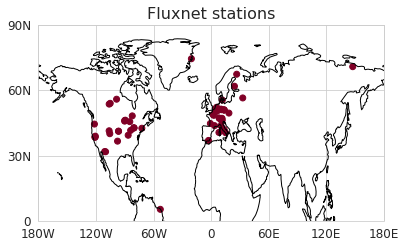

In [9]:
fig = plt.figure(figsize=(16,16))

ax1 = maps.contourmap_bothcontinents_scatter_nh_pos(fig, np.ones([len(lonuse)]), lonuse, latuse, 0.1,-1,1,'Fluxnet stations',
                                                   0.02,0.32,0.8,0.97)

In [38]:
# Read in the data for stations that will be used.
count=0
for istation in stationuse:
    fname = glob(datdir+'*'+istation+'*/*DD*')
    data = pd.read_csv(fname[0])
    data = data[['TIMESTAMP','TA_F','TA_F_QC','H_F_MDS','H_F_MDS_QC','G_F_MDS','G_F_MDS_QC','NETRAD','NETRAD_QC', 
                 'LE_F_MDS', 'SWC_F_MDS_1', 'SW_IN', 'SW_OUT', 'LW_IN', 'LW_OUT']]
    ybeg = str(data[['TIMESTAMP']].iloc[0].values)[1:5]
    yend = str(data[['TIMESTAMP']].iloc[len(data[['TIMESTAMP']])-1].values)[1:5]
    timeout = pd.date_range(start=ybeg+"-01-01", end=yend+"-12-31")
    timeoutasdata = [str(timeout[i].year)+str(timeout[i].month).zfill(2)+str(timeout[i].day).zfill(2) for i in np.arange(0,len(timeout),1)]
    timeoutasdata = [int(i) for i in timeoutasdata]  
    
    tas = np.empty([len(timeoutasdata)]) ; tas_qc = np.empty([len(timeoutasdata)])
    shflx = np.empty([len(timeoutasdata)]) ; shflx_qc = np.empty([len(timeoutasdata)])
    g = np.empty([len(timeoutasdata)]) ; g_qc = np.empty([len(timeoutasdata)])
    netrad = np.empty([len(timeoutasdata)]) ; netrad_qc = np.empty([len(timeoutasdata)])
    slhf = np.empty([len(timeoutasdata)]); swc = np.empty([len(timeoutasdata)])
    sw_in = np.empty([len(timeoutasdata)]); sw_out = np.empty([len(timeoutasdata)])
    lw_in = np.empty([len(timeoutasdata)]); lw_out = np.empty([len(timeoutasdata)])
    
    tas[:] = nan ; tas_qc[:] = nan
    shflx[:] = nan ; shflx_qc[:] = nan
    g[:] = nan ; g_qc[:] =  nan
    netrad[:] = nan ; netrad_qc[:] = nan
    slhf[:] = nan; swc[:] = nan
    sw_in[:] = nan; sw_out[:] = nan
    lw_in[:] = nan; lw_out[:] = nan
    
    # find the dates that exist in the file and assign to the right place in the output array
    datesinds = dict()
    for i, j in enumerate(timeoutasdata):
        datesinds.setdefault(j,[]).append(i)        
    res = [datesinds.get(i,[None]) for i in data['TIMESTAMP']]
    
    shflx[np.array(res).squeeze()] = data['H_F_MDS']
    tas[np.array(res).squeeze()] = data['TA_F']
    tas_qc[np.array(res).squeeze()] = data['TA_F_QC']
    g[np.array(res).squeeze()] = data['G_F_MDS']   
    g_qc[np.array(res).squeeze()] = data['G_F_MDS_QC']
    shflx_qc[np.array(res).squeeze()] = data['H_F_MDS_QC']
    netrad[np.array(res).squeeze()] = data['NETRAD']
    netrad_qc[np.array(res).squeeze()] = data['NETRAD_QC']  
    slhf[np.array(res).squeeze()] = data['LE_F_MDS']
    swc[np.array(res).squeeze()] = data['SWC_F_MDS_1']
    sw_in[np.array(res).squeeze()] = data['SW_IN']
    sw_out[np.array(res).squeeze()] = data['SW_OUT']
    lw_in[np.array(res).squeeze()] = data['LW_IN']
    lw_out[np.array(res).squeeze()] = data['LW_OUT']
    

    lon_xr = xr.DataArray(np.array(lonuse[count]), name='lon')
    lat_xr = xr.DataArray(np.array(latuse[count]), name='lat')
    shflx_xr = xr.DataArray(np.array(shflx), coords=[timeout], dims=['time'], name='shflx')
    tas_xr = xr.DataArray(np.array(tas), coords=[timeout], dims=['time'], name='tas')
    g_xr = xr.DataArray(np.array(g), coords=[timeout], dims=['time'], name='g')
    netrad_xr = xr.DataArray(np.array(netrad), coords=[timeout], dims=['time'], name='netrad')
    slhf_xr = xr.DataArray(np.array(slhf), coords=[timeout], dims=['time'], name='slhf')
    
    swin_xr = xr.DataArray(np.array(sw_in), coords=[timeout], dims=['time'], name='sw_in')
    swout_xr = xr.DataArray(np.array(sw_out), coords=[timeout], dims=['time'], name='sw_out')
    lwin_xr = xr.DataArray(np.array(lw_in), coords=[timeout], dims=['time'], name='lw_in')
    lwout_xr = xr.DataArray(np.array(lw_out), coords=[timeout], dims=['time'], name='lw_out')
    
    swc_xr = xr.DataArray(np.array(swc), coords=[timeout], dims=['time'], name='swc')
    
    shflx_qc_xr = xr.DataArray(np.array(shflx_qc), coords=[timeout], dims=['time'], name='shflx_qc')
    tas_qc_xr = xr.DataArray(np.array(tas_qc), coords=[timeout], dims=['time'], name='tas_qc')
    g_qc_xr = xr.DataArray(np.array(g_qc), coords=[timeout], dims=['time'], name='g_qc')
    netrad_qc_xr = xr.DataArray(np.array(netrad_qc), coords=[timeout], dims=['time'], name='netrad_qc')
    
    shflx_xr.to_netcdf(path=outdir+istation+".nc")
    tas_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    g_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    netrad_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    netrad_qc_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    shflx_qc_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    tas_qc_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    g_qc_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    
    slhf_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    swc_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    
    swin_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    swout_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    lwin_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    lwout_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    
    lon_xr.to_netcdf(path=outdir+istation+".nc", mode="a")
    lat_xr.to_netcdf(path=outdir+istation+".nc", mode="a")  
    
    count=count+1

In [39]:
count

0

In [4]:
ca_gro = xr.open_dataset("/home/dhruv/fluxnet/CA-Gro.nc")

In [5]:
ca_gro

<xarray.Dataset>
Dimensions:    (time: 4383)
Coordinates:
  * time       (time) datetime64[ns] 2003-01-01 2003-01-02 ... 2014-12-31
Data variables:
    shflx      (time) float64 ...
    tas        (time) float64 ...
    g          (time) float64 ...
    netrad     (time) float64 ...
    netrad_qc  (time) float64 ...
    shflx_qc   (time) float64 ...
    tas_qc     (time) float64 ...
    g_qc       (time) float64 ...
    slhf       (time) float64 ...
    lon        float64 ...
    lat        float64 ...

In [54]:
def fluxes_for_station(station_data):
    # sensible heat flux
    e_sshf = xr.open_dataset("/home/data/ERA5/sshf/monthly/sshf.nc")
    m_sshf = xr.open_dataset("/home/data/MERRA2/sshf/monthly/sshf.nc")
    
    e_sshf_temp = e_sshf.sshf.sel(time=slice(min(station_data.time).values, max(station_data.time).values)).sel(
    {'lat':station_data.lat.values,'lon':station_data.lon.values}, method='nearest').groupby("time.month").mean()

    m_sshf_temp = m_sshf.HFLUX.sel(time=slice(min(station_data.time).values, max(station_data.time).values)).sel(
    {'lat':station_data.lat.values,'lon':station_data.lon.values}, method='nearest').groupby("time.month").mean()
    
    monthly_sshf = station_data.shflx.groupby("time.month").mean()
    
    # latent heat flux
    e_slhf = xr.open_dataset("/home/data/ERA5/slhf/monthly/slhf.nc")
    m_slhf = xr.open_dataset("/home/data/MERRA2/slhf/monthly/slhf.nc")
    
    e_slhf_temp = e_slhf.slhf.sel(time=slice(min(station_data.time).values, max(station_data.time).values)).sel(
    {'lat':station_data.lat.values,'lon':station_data.lon.values}, method='nearest').groupby("time.month").mean()

    m_slhf_temp = m_slhf.EFLUX.sel(time=slice(min(station_data.time).values, max(station_data.time).values)).sel(
    {'lat':station_data.lat.values,'lon':station_data.lon.values}, method='nearest').groupby("time.month").mean()
    
    monthly_slhf = station_data.slhf.groupby("time.month").mean()
    
    #plotting
    plt.figure(figsize=(8,12))
    fig, ax = plt.subplots(1,2)
    plt.suptitle("green = fluxnet, red = era, blue = merra")
    
    ax[0].scatter(monthly_sshf.month, monthly_sshf, color='g')
    ax[0].scatter(e_sshf_temp.month, e_sshf_temp, color='r')
    ax[0].scatter(m_sshf_temp.month, m_sshf_temp, color='b')
    ax[0].set_xticks(range(1,13))
    ax[0].set_title("sensible heat flux (W/m^2)")
    
    ax[1].scatter(monthly_slhf.month, monthly_slhf, color='g')
    ax[1].scatter(e_slhf_temp.month, e_slhf_temp, color='r')
    ax[1].scatter(m_slhf_temp.month, m_slhf_temp, color='b')
    ax[1].set_xticks(range(1,13))
    ax[1].set_title("latent heat flux (W/m^2)")
    
    plt.tight_layout()

In [8]:
def scatter(station_data, site_name=""):
    # need to mask based on na values
    
    lat, lon = station_data.lat.values, station_data.lon.values
    min_time, max_time = min(station_data.time).values, max(station_data.time).values
    
    e_sshf = xr.open_dataset("/home/data/ERA5/sshf/monthly/sshf.nc").sshf.sel(time=slice(min_time, max_time))
    m_sshf = xr.open_dataset("/home/data/MERRA2/sshf/monthly/sshf.nc").HFLUX.sel(time=slice(min_time, max_time))
    
    e_slhf = xr.open_dataset("/home/data/ERA5/slhf/monthly/slhf.nc").slhf.sel(time=slice(min_time, max_time))
    m_slhf = xr.open_dataset("/home/data/MERRA2/slhf/monthly/slhf.nc").EFLUX.sel(time=slice(min_time, max_time))
    
    e_sshf_means = e_sshf.sel({'time':e_sshf['time.season']=='JJA'}).sel(lat=lat, lon=lon, method='nearest').groupby("time.year").mean()
    e_slhf_means = e_slhf.sel({'time':e_slhf['time.season']=='JJA'}).sel(lat=lat, lon=lon, method='nearest').groupby("time.year").mean()

    m_sshf_means = m_sshf.sel({'time':m_sshf['time.season']=='JJA'}).sel(lat=lat, lon=lon, method='nearest').groupby("time.year").mean()
    m_slhf_means = m_slhf.sel({'time':m_slhf['time.season']=='JJA'}).sel(lat=lat, lon=lon, method='nearest').groupby("time.year").mean()
    
    monthly_sshf = station_data.shflx.sel({'time':station_data['time.season']=='JJA'}).groupby("time.year").mean()
    monthly_slhf = station_data.slhf.sel({'time':station_data['time.season']=='JJA'}).groupby("time.year").mean()

    sns.scatterplot(x=e_sshf_means, y=e_slhf_means, marker='+')
    sns.scatterplot(x=m_sshf_means, y=m_slhf_means, marker='x')
    sns.scatterplot(x=monthly_sshf, y=monthly_slhf, marker='o')

    plt.title("Comparing Summer sensible and latent heat flux across \n MERRA2(x), ERA5(+) and FLUXNET(o) at \n {} i.e. {},{}".format(
        site_name, lat, lon))

<Figure size 576x864 with 0 Axes>

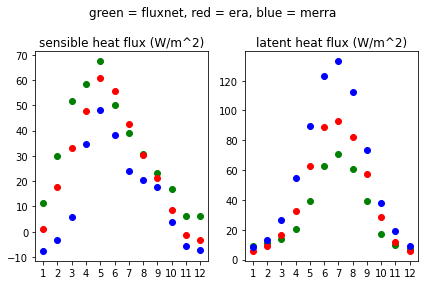

In [55]:
fluxes_for_station(ca_gro) # mixed forests

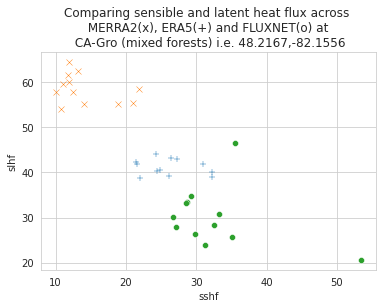

In [11]:
scatter(ca_gro, "CA-Gro (mixed forests)")

<Figure size 576x864 with 0 Axes>

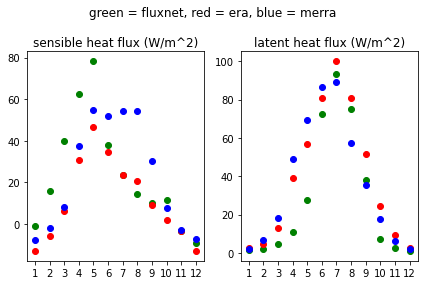

In [56]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/CA-Oas.nc")) # deciduous broadleaf forests

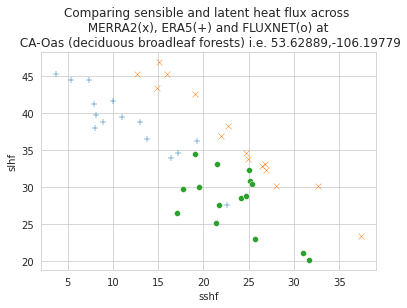

In [12]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/CA-Oas.nc"), "CA-Oas (deciduous broadleaf forests)")

<Figure size 576x864 with 0 Axes>

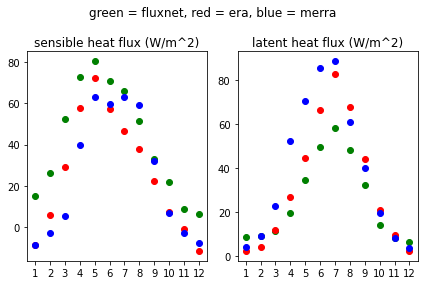

In [57]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/CA-Obs.nc")) # evergreen needleleaf forests

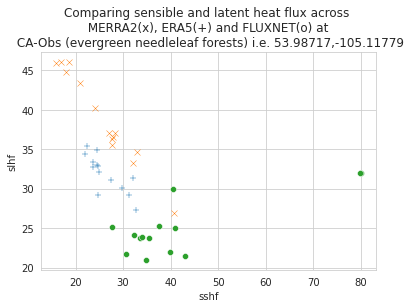

In [13]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/CA-Obs.nc"), "CA-Obs (evergreen needleleaf forests)")

<Figure size 576x864 with 0 Axes>

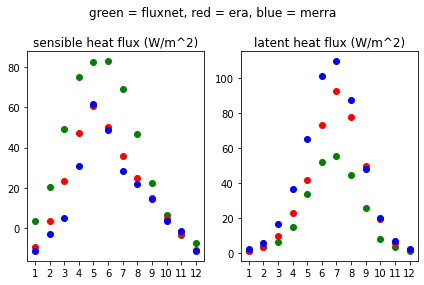

In [61]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/CA-Man.nc")) # evergreen needleleaf forests

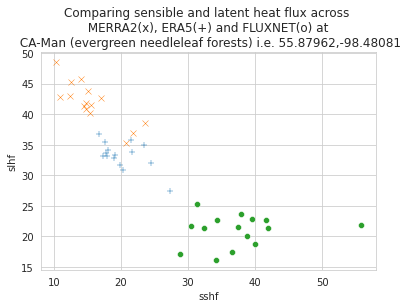

In [14]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/CA-Man.nc"), "CA-Man (evergreen needleleaf forests)")

<Figure size 576x864 with 0 Axes>

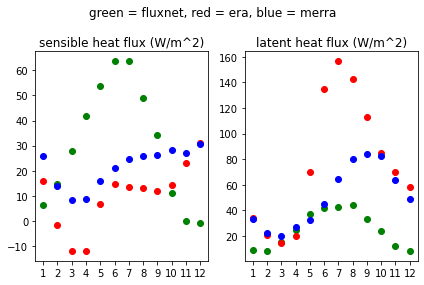

In [58]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/CA-TP1.nc")) # evergreen needleleaf forests (in toronto)

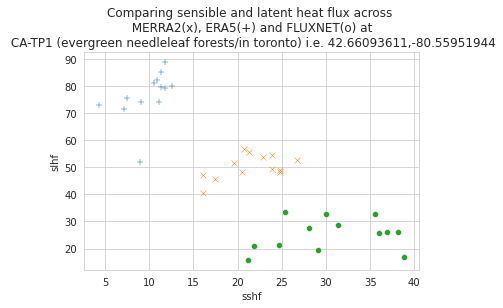

In [15]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/CA-TP1.nc"), "CA-TP1 (evergreen needleleaf forests/in toronto)")

<Figure size 576x864 with 0 Axes>

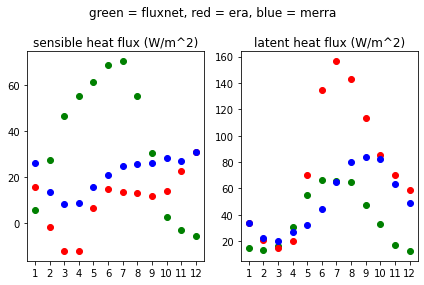

In [60]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/CA-TP3.nc")) # evergreen needleleaf forests (in toronto)

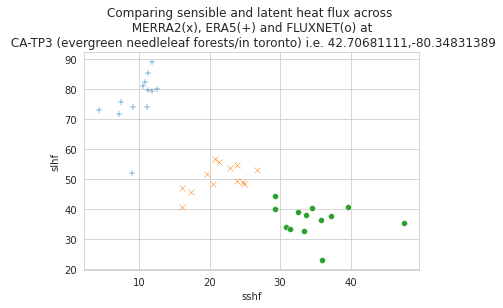

In [16]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/CA-TP3.nc"), "CA-TP3 (evergreen needleleaf forests/in toronto)")

<Figure size 576x864 with 0 Axes>

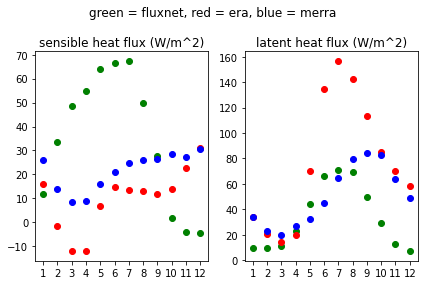

In [59]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/CA-TP4.nc")) # evergreen needleleaf forests (in toronto)

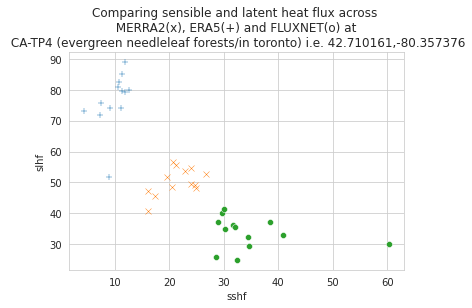

In [17]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/CA-TP4.nc"), "CA-TP4 (evergreen needleleaf forests/in toronto)")

<Figure size 576x864 with 0 Axes>

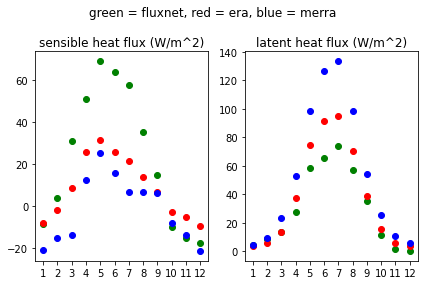

In [62]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/RU-Fyo.nc")) # evergreen needleleaf forests

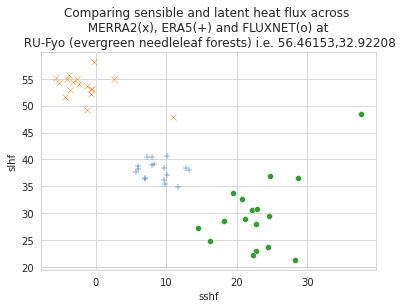

In [19]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/RU-Fyo.nc"), "RU-Fyo (evergreen needleleaf forests)")

<Figure size 576x864 with 0 Axes>

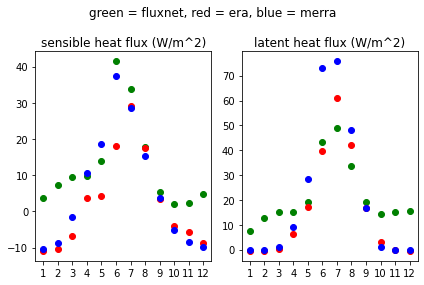

In [63]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/RU-Cok.nc")) # open shrublands

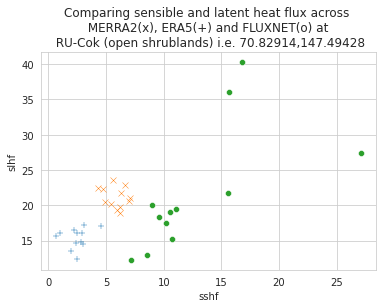

In [21]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/RU-Cok.nc"), "RU-Cok (open shrublands)")

<Figure size 576x864 with 0 Axes>

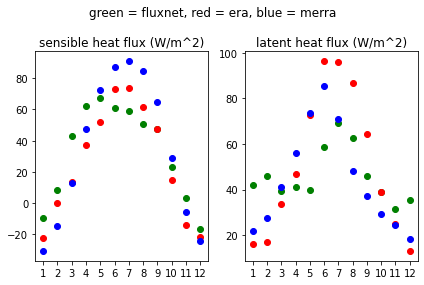

In [65]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/US-GLE.nc")) # evergreen needleleaf forests

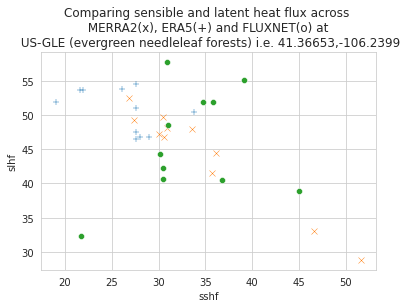

In [22]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/US-GLE.nc"), "US-GLE (evergreen needleleaf forests)")

<Figure size 576x864 with 0 Axes>

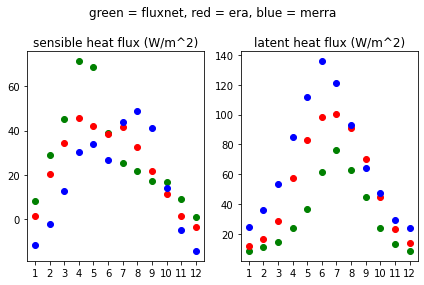

In [66]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/US-Ha1.nc")) # deciduous broadleaf forests

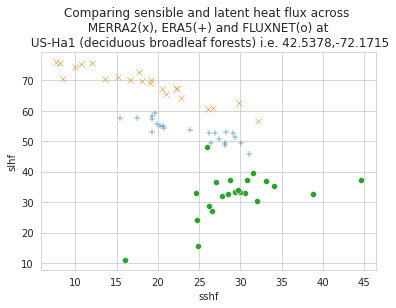

In [23]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/US-Ha1.nc"), "US-Ha1 (deciduous broadleaf forests)")

<Figure size 576x864 with 0 Axes>

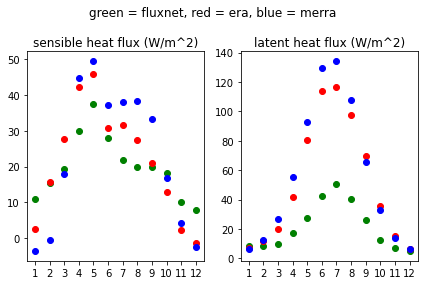

In [67]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/US-Los.nc")) # permanent wetlands (shrub wetland site)

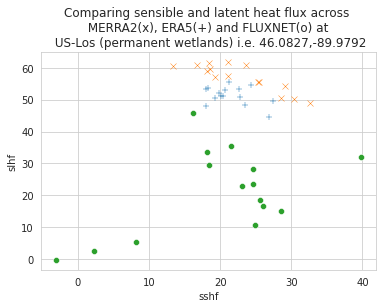

In [24]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/US-Los.nc"), "US-Los (permanent wetlands)")

<Figure size 576x864 with 0 Axes>

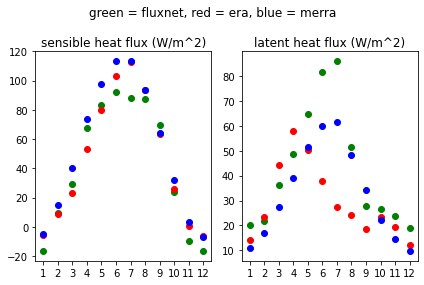

In [68]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/US-Me2.nc")) # evergreen needleleaf forests

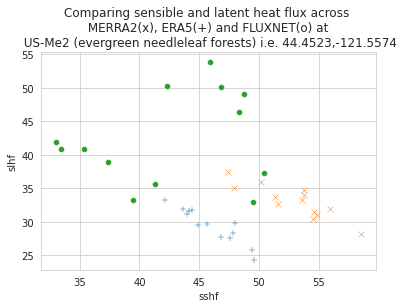

In [25]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/US-Me2.nc"), "US-Me2 (evergreen needleleaf forests)")

<Figure size 576x864 with 0 Axes>

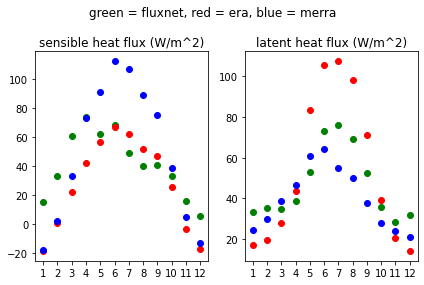

In [69]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/US-NR1.nc")) # evergreen needleleaf forests

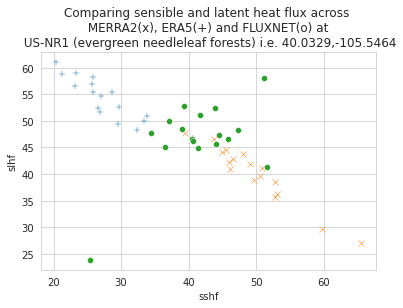

In [26]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/US-NR1.nc"), "US-NR1 (evergreen needleleaf forests)")

<Figure size 576x864 with 0 Axes>

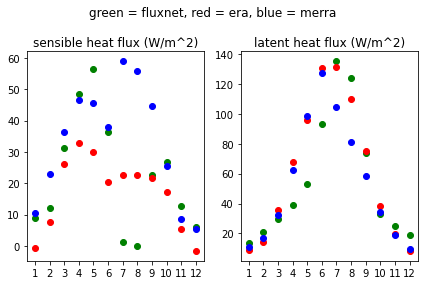

In [70]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/US-Ne2.nc")) # croplands (irrigated maize-soybean rotation site)

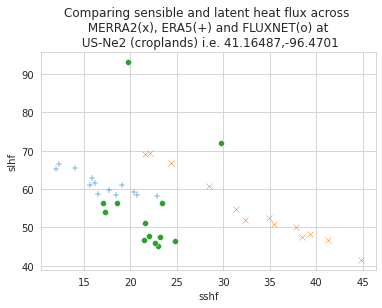

In [27]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/US-Ne2.nc"), "US-Ne2 (croplands)")

<Figure size 576x864 with 0 Axes>

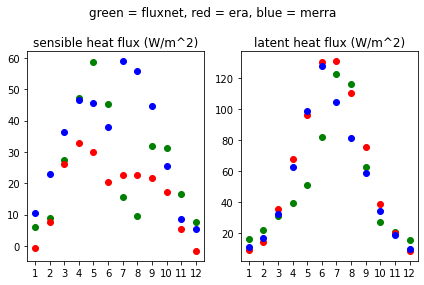

In [71]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/US-Ne3.nc")) # croplands (irrigated maize-soybean rotation site)

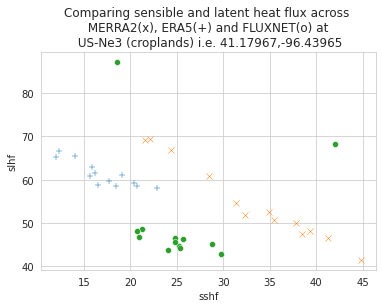

In [28]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/US-Ne3.nc"), "US-Ne3 (croplands)")

<Figure size 576x864 with 0 Axes>

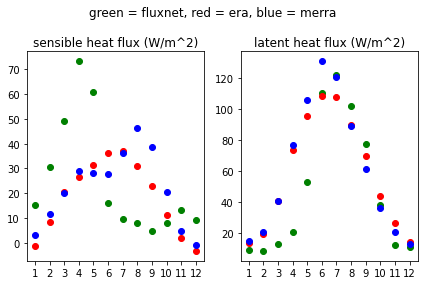

In [72]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/US-Oho.nc")) # deciduous broadleaf forests

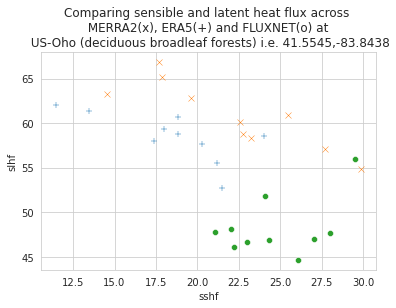

In [29]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/US-Oho.nc"), "US-Oho (deciduous broadleaf forests)")

<Figure size 576x864 with 0 Axes>

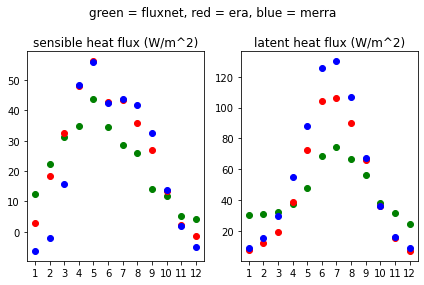

In [73]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/US-Syv.nc")) # mixed forests

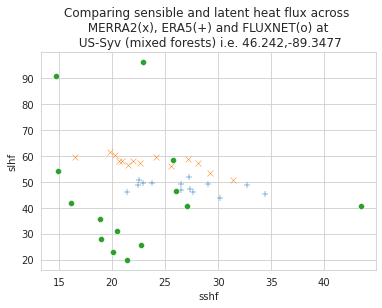

In [30]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/US-Syv.nc"), "US-Syv (mixed forests)")

<Figure size 576x864 with 0 Axes>

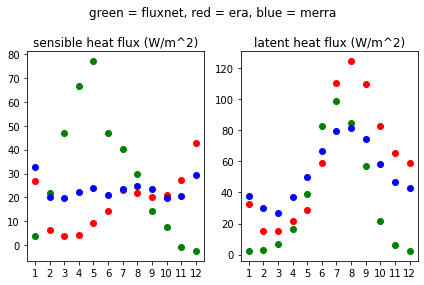

In [74]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/US-UMB.nc")) # deciduous broadleaf forests

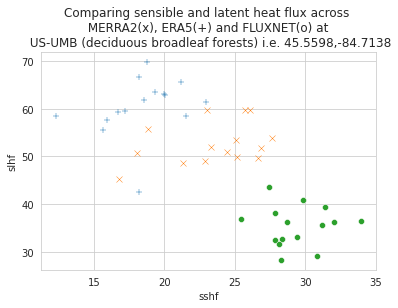

In [31]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/US-UMB.nc"), "US-UMB (deciduous broadleaf forests)")

<Figure size 576x864 with 0 Axes>

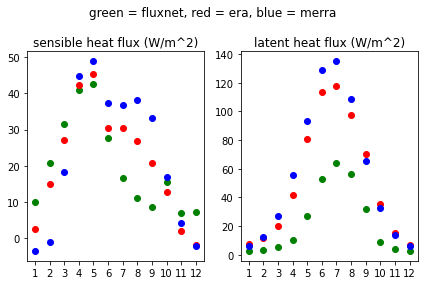

In [75]:
fluxes_for_station(xr.open_dataset("/home/dhruv/fluxnet/US-WCr.nc")) # deciduous broadleaf forests

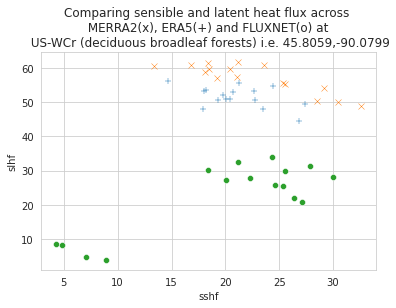

In [33]:
scatter(xr.open_dataset("/home/dhruv/fluxnet/US-WCr.nc"), "US-WCr (deciduous broadleaf forests)")

In [8]:
def sum_nans(station_data):
    num_nans_sshf = sum(np.isnan(station_data.shflx))
    num_nans_slhf = sum(np.isnan(station_data.slhf))
    return (num_nans_sshf, num_nans_slhf)

In [12]:
f_names = glob(outdir+"*")

In [18]:
for f in f_names:
    print("{}: {}".format(f, sum_nans(xr.open_dataset(f))))
    print()

/home/dhruv/fluxnet/US-WCr.nc: (<xarray.DataArray 'shflx' ()>
array(0), <xarray.DataArray 'slhf' ()>
array(0))

/home/dhruv/fluxnet/US-UMB.nc: (<xarray.DataArray 'shflx' ()>
array(0)
Coordinates:
    time     datetime64[ns] 2014-12-31, <xarray.DataArray 'slhf' ()>
array(0)
Coordinates:
    time     datetime64[ns] 2014-12-31)

/home/dhruv/fluxnet/RU-Cok.nc: (<xarray.DataArray 'shflx' ()>
array(0)
Coordinates:
    time     datetime64[ns] 2014-12-31, <xarray.DataArray 'slhf' ()>
array(0)
Coordinates:
    time     datetime64[ns] 2014-12-31)

/home/dhruv/fluxnet/US-Ha1.nc: (<xarray.DataArray 'shflx' ()>
array(0), <xarray.DataArray 'slhf' ()>
array(0))

/home/dhruv/fluxnet/US-Ne3.nc: (<xarray.DataArray 'shflx' ()>
array(0), <xarray.DataArray 'slhf' ()>
array(0))

/home/dhruv/fluxnet/US-GLE.nc: (<xarray.DataArray 'shflx' ()>
array(0), <xarray.DataArray 'slhf' ()>
array(0))

/home/dhruv/fluxnet/CA-Man.nc: (<xarray.DataArray 'shflx' ()>
array(0)
Coordinates:
    time     datetime64[ns] 2008-12-

In [17]:
sum_nans(xr.open_dataset(f_names[0]))

(<xarray.DataArray 'shflx' ()>
 array(0),
 <xarray.DataArray 'slhf' ()>
 array(0))

In [5]:
H_files = glob("/home/data/FLUXCOM/RS_METEO/monthly/H*")
LE_files = glob("/home/data/FLUXCOM/RS_METEO/monthly/LE*")
Rn_files = glob("/home/data/FLUXCOM/RS_METEO/monthly/Rn*")

In [98]:
h = xr.open_mfdataset(H_files)
le = xr.open_mfdataset(LE_files)
rn = xr.open_mfdataset(Rn_files)

In [99]:
h['H'] = h.H*11.574
h.H.attrs['units'] = "W m**-2"
h.H.attrs['long_name'] = "sensible heat"
h.H.attrs['_FillvALUE'] = -9999.0

le['LE'] = le.LE*11.574
le.LE.attrs['units'] = "W m**-2"
le.LE.attrs['long_name'] = "latent heat"
le.LE.attrs['_FillvALUE'] = -9999.0

rn['Rn'] = rn.Rn*11.574
rn.Rn.attrs['units'] = "W m**-2"
rn.Rn.attrs['long_name'] = "net radiation"
rn.Rn.attrs['_FillvALUE'] = -9999.0

In [63]:
e_h = xr.open_dataset("/home/data/ERA5/sshf/monthly/sshf.nc").sel(time=slice("2001-01-01", "2013-12-01"))
m_h = xr.open_dataset("/home/data/MERRA2/sshf/monthly/sshf.nc").sel(time=slice("2001-01-01", "2013-12-01"))

In [19]:
def plot_climatology(x, show_ocean=True, limits=False, lmin=None, lmax=None, cmap=cmo.thermal, pre_title=""):
    avg = x.mean('time')
    fig = plt.figure(figsize=(12,8))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.coastlines()
    
    if(limits):
        avg.plot(ax=ax, vmin=lmin, vmax=lmax, cbar_kwargs={'shrink':0.5}, cmap=cmap, levels=np.linspace(lmin,lmax,11))
    else:
        avg.plot(ax=ax, vmin=lmin, vmax=lmax, cbar_kwargs={'shrink':0.5}, cmap=cmap)
    
    if show_ocean == False:
        ax.add_feature(cfeature.OCEAN, zorder=100, color='w')
        
#     plt.title("{} Climatology of {}, Units: {}".format(pre_title, x.attrs['long_name'], x.attrs['units']))

/home/dhruv/my_venv/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


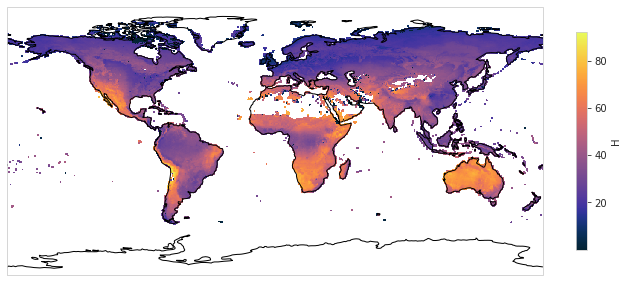

In [100]:
plot_climatology(h.H)

In [101]:
rn.Rn

<xarray.DataArray 'Rn' (time: 156, lat: 360, lon: 720)>
dask.array<mul, shape=(156, 360, 720), dtype=float32, chunksize=(12, 360, 720), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float64 89.75 89.25 88.75 88.25 ... -88.75 -89.25 -89.75
  * time     (time) datetime64[ns] 2001-01-16 2001-02-16 ... 2013-12-16
Attributes:
    units:       W m**-2
    long_name:   net radiation
    _FillvALUE:  -9999.0

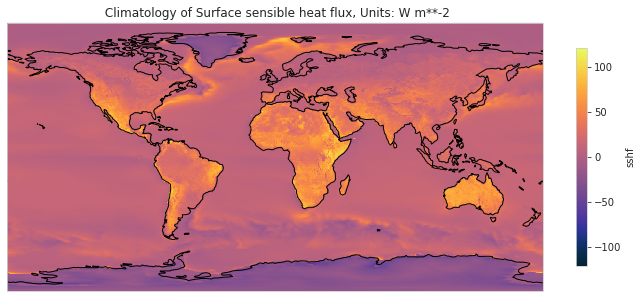

In [65]:
plot_climatology(e_h.sshf)

/home/dhruv/my_venv/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


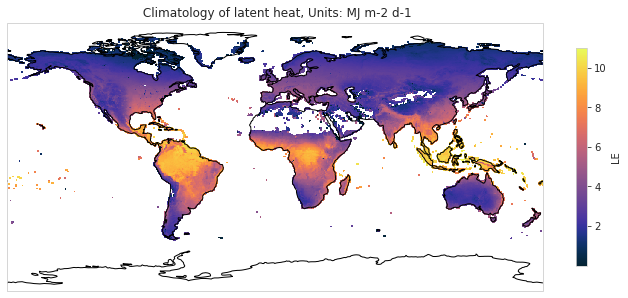

In [29]:
plot_climatology(le.LE)

In [102]:
h = h.reindex_like(e_h, method="nearest")
h.H

<xarray.DataArray 'H' (time: 156, lat: 361, lon: 576)>
dask.array<getitem, shape=(156, 361, 576), dtype=float32, chunksize=(12, 361, 576), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -90.0 -89.5 -89.0 -88.5 -88.0 ... 88.5 89.0 89.5 90.0
  * lon      (lon) float64 -180.0 -179.4 -178.8 -178.1 ... 178.1 178.8 179.4
  * time     (time) datetime64[ns] 2001-01-01 2001-02-01 ... 2013-12-01
Attributes:
    units:       W m**-2
    long_name:   sensible heat
    _FillvALUE:  -9999.0

In [93]:
def jja(month):
    return (month >= 6) & (month <= 8)

def djf(month):
    return (month == 12) | (month <= 2)

/home/dhruv/my_venv/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


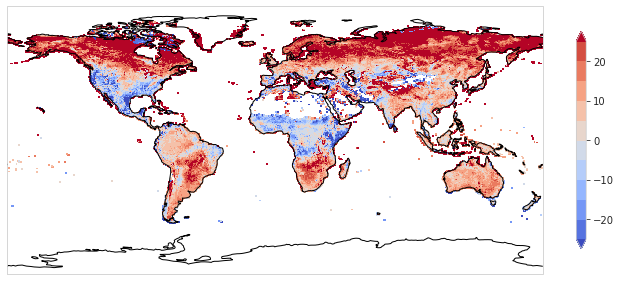

In [107]:
plot_climatology(h.H.sel(time=jja(h.H['time.month']))-e_h.sshf.sel(time=jja(h.H['time.month'])), limits=True, lmin=-25, lmax=25, cmap="coolwarm")

/home/dhruv/my_venv/lib/python3.9/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


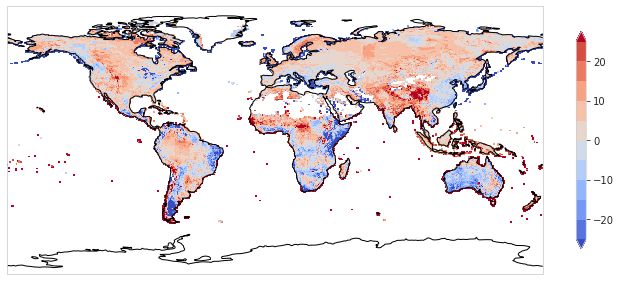

In [108]:
plot_climatology(h.H.sel(time=djf(h.H['time.month']))-e_h.sshf.sel(time=djf(h.H['time.month'])), limits=True, lmin=-25, lmax=25, cmap="coolwarm")

In [89]:
plot_climatology(h.H.sel(time=jja(h.H['time.month']))-m_h.HFLUX.sel(time=jja(h.H['time.month'])), limits=True, lmin=-25, lmax=25)

IndexError: The indexing operation you are attempting to perform is not valid on netCDF4.Variable object. Try loading your data into memory first by calling .load().

In [92]:
e_h.sshf.sel(time=jja(h.H['time.month']))-m_h.HFLUX.sel(time=jja(h.H['time.month']))

IndexError: The indexing operation you are attempting to perform is not valid on netCDF4.Variable object. Try loading your data into memory first by calling .load().

In [55]:
h.H

AttributeError: 'DatasetResample' object has no attribute 'H'

In [3]:
stations = glob(outdir+"*.nc")

In [5]:
stations

['/home/dhruv/fluxnet/FR-Pue.nc',
 '/home/dhruv/fluxnet/US-WCr.nc',
 '/home/dhruv/fluxnet/GF-Guy.nc',
 '/home/dhruv/fluxnet/FR-Gri.nc',
 '/home/dhruv/fluxnet/AT-Neu.nc',
 '/home/dhruv/fluxnet/US-Var.nc',
 '/home/dhruv/fluxnet/US-UMB.nc',
 '/home/dhruv/fluxnet/RU-Cok.nc',
 '/home/dhruv/fluxnet/BE-Lon.nc',
 '/home/dhruv/fluxnet/US-Ha1.nc',
 '/home/dhruv/fluxnet/US-Ne3.nc',
 '/home/dhruv/fluxnet/CH-Dav.nc',
 '/home/dhruv/fluxnet/FI-Hyy.nc',
 '/home/dhruv/fluxnet/US-GLE.nc',
 '/home/dhruv/fluxnet/DK-Sor.nc',
 '/home/dhruv/fluxnet/US-Blo.nc',
 '/home/dhruv/fluxnet/ZM-Mon.nc',
 '/home/dhruv/fluxnet/IT-Noe.nc',
 '/home/dhruv/fluxnet/CA-Man.nc',
 '/home/dhruv/fluxnet/BE-Vie.nc',
 '/home/dhruv/fluxnet/FR-Fon.nc',
 '/home/dhruv/fluxnet/US-NR1.nc',
 '/home/dhruv/fluxnet/US-SRM.nc',
 '/home/dhruv/fluxnet/NL-Loo.nc',
 '/home/dhruv/fluxnet/US-Syv.nc',
 '/home/dhruv/fluxnet/CA-Oas.nc',
 '/home/dhruv/fluxnet/BR-Sa1.nc',
 '/home/dhruv/fluxnet/CA-Gro.nc',
 '/home/dhruv/fluxnet/CA-TP4.nc',
 '/home/dhruv/

In [6]:
avg_sshf_stat = []
avg_slhf_stat = []
cor_coeffs = []
lats =[]
lons = []

for i in stations:
    print(i)
    temp1 = xr.open_dataset(i)
    if(np.count_nonzero(np.isnan(temp1.shflx)) != 0):         # check for NaNs
        print("NaN value in "+i)
    if(np.count_nonzero(np.isnan(temp1.slhf)) != 0):         # check for NaNs
        print("NaN value in "+i)
    avg_sshf_stat.append(temp1.sel({'time':temp1['time.season']=='JJA'}).shflx.mean().item())
    avg_slhf_stat.append(temp1.sel({'time':temp1['time.season']=='JJA'}).slhf.mean().item())
    cor_coeffs.append(np.corrcoef(temp1.sel({'time':temp1['time.season']=='JJA'}).shflx.data, temp1.sel({'time':temp1['time.season']=='JJA'}).slhf.data)[0,1])
    
    
    lats.append(temp1.lat.item())
    lons.append(temp1.lon.item())

flx_fn = pd.DataFrame(data= {'lats':lats,'lons':lons,
                         'avg_sshf_stat':avg_sshf_stat,
                         'avg_slhf_stat':avg_slhf_stat,
                            "cor_coeffs":cor_coeffs})

/home/dhruv/fluxnet/FR-Pue.nc
/home/dhruv/fluxnet/US-WCr.nc
/home/dhruv/fluxnet/GF-Guy.nc
/home/dhruv/fluxnet/FR-Gri.nc
/home/dhruv/fluxnet/AT-Neu.nc
/home/dhruv/fluxnet/US-Var.nc
/home/dhruv/fluxnet/US-UMB.nc
/home/dhruv/fluxnet/RU-Cok.nc
/home/dhruv/fluxnet/BE-Lon.nc
/home/dhruv/fluxnet/US-Ha1.nc
/home/dhruv/fluxnet/US-Ne3.nc
/home/dhruv/fluxnet/CH-Dav.nc
/home/dhruv/fluxnet/FI-Hyy.nc
/home/dhruv/fluxnet/US-GLE.nc
/home/dhruv/fluxnet/DK-Sor.nc
/home/dhruv/fluxnet/US-Blo.nc
/home/dhruv/fluxnet/ZM-Mon.nc
/home/dhruv/fluxnet/IT-Noe.nc
/home/dhruv/fluxnet/CA-Man.nc
/home/dhruv/fluxnet/BE-Vie.nc
/home/dhruv/fluxnet/FR-Fon.nc
/home/dhruv/fluxnet/US-NR1.nc
/home/dhruv/fluxnet/US-SRM.nc
/home/dhruv/fluxnet/NL-Loo.nc
/home/dhruv/fluxnet/US-Syv.nc
/home/dhruv/fluxnet/CA-Oas.nc
/home/dhruv/fluxnet/BR-Sa1.nc
/home/dhruv/fluxnet/CA-Gro.nc
/home/dhruv/fluxnet/CA-TP4.nc
/home/dhruv/fluxnet/IT-Col.nc
/home/dhruv/fluxnet/DE-Geb.nc
/home/dhruv/fluxnet/IT-SRo.nc
/home/dhruv/fluxnet/CA-TP1.nc
/home/dhru

In [12]:
mins, maxes = [], []
for i in stations:
    temp = xr.open_dataset(i)
    mn = min(temp.time.values)
    mins.append(mn)
    mx = max(temp.time.values)
    maxes.append(mx)
    
min(mins), max(maxes)

(numpy.datetime64('1991-01-01T00:00:00.000000000'),
 numpy.datetime64('2014-12-31T00:00:00.000000000'))

In [15]:
extent = [-135, -60, 23, 70]

def pltClimStations(dat,stat_avg=0,df='',scatter=True, mn=0,mx=100,lvn=10,cmap=cmo.thermal,dataset='Merra2'):
    md_avg = dat.sel({'time':dat['time.season']=='JJA'}).mean('time')
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

    ax.set_extent(extent, crs=ccrs.PlateCarree())
    plt.contourf(dat.lon, dat.lat, md_avg, cmap = cmap,
                 vmin = mn, vmax = mx,levels = np.linspace(mn,mx,lvn+1),extend = 'both')
    plt.colorbar(shrink = 0.5)
    
    if(scatter):
        plt.scatter(x = df.lons, y = df.lats, c = stat_avg,
                   cmap = cmap,s=150, alpha=.8, linewidths=1.5,
                   edgecolors='white' ,transform=ccrs.PlateCarree(),
                   vmin = mn, vmax = mx,zorder = 5 )

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')

    plt.title( dataset + '\nJJA Average ' + dat.attrs['long_name'])
        
    plt.show()

In [26]:
avg_sshf_stat = []
avg_slhf_stat = []
cor_coeffs = []
variance_sshf = []
variance_slhf = []
lats =[]
lons = []

for i in stations:
    print(i)
    temp1 = xr.open_dataset(i)
    if(np.count_nonzero(np.isnan(temp1.shflx)) != 0):         # check for NaNs
        print("NaN value in "+i)
    if(np.count_nonzero(np.isnan(temp1.slhf)) != 0):         # check for NaNs
        print("NaN value in "+i)
    avg_sshf_stat.append(temp1.sel({'time':temp1['time.season']=='JJA'}).shflx.mean().item())
    avg_slhf_stat.append(temp1.sel({'time':temp1['time.season']=='JJA'}).slhf.mean().item())
    variance_sshf.append(temp1.sel({'time':temp1['time.season']=='JJA'}).shflx.var().item())
    variance_slhf.append(temp1.sel({'time':temp1['time.season']=='JJA'}).slhf.var().item())
    cor_coeffs.append(np.corrcoef(temp1.sel({'time':temp1['time.season']=='JJA'}).shflx.data, temp1.sel({'time':temp1['time.season']=='JJA'}).slhf.data)[0,1])
    
    
    lats.append(temp1.lat.item())
    lons.append(temp1.lon.item())

flx_fn = pd.DataFrame(data= {'lats':lats,'lons':lons,
                         'avg_sshf_stat':avg_sshf_stat,
                         'avg_slhf_stat':avg_slhf_stat,
                            "cor_coeffs":cor_coeffs,
                            'var_sshf':variance_sshf,
                            'var_slhf':variance_slhf})

/home/dhruv/fluxnet/FR-Pue.nc
/home/dhruv/fluxnet/US-WCr.nc
/home/dhruv/fluxnet/GF-Guy.nc
/home/dhruv/fluxnet/FR-Gri.nc
/home/dhruv/fluxnet/AT-Neu.nc
/home/dhruv/fluxnet/US-Var.nc
/home/dhruv/fluxnet/US-UMB.nc
/home/dhruv/fluxnet/RU-Cok.nc
/home/dhruv/fluxnet/BE-Lon.nc
/home/dhruv/fluxnet/US-Ha1.nc
/home/dhruv/fluxnet/US-Ne3.nc
/home/dhruv/fluxnet/CH-Dav.nc
/home/dhruv/fluxnet/FI-Hyy.nc
/home/dhruv/fluxnet/US-GLE.nc
/home/dhruv/fluxnet/DK-Sor.nc
/home/dhruv/fluxnet/US-Blo.nc
/home/dhruv/fluxnet/ZM-Mon.nc
/home/dhruv/fluxnet/IT-Noe.nc
/home/dhruv/fluxnet/CA-Man.nc
/home/dhruv/fluxnet/BE-Vie.nc
/home/dhruv/fluxnet/FR-Fon.nc
/home/dhruv/fluxnet/US-NR1.nc
/home/dhruv/fluxnet/US-SRM.nc
/home/dhruv/fluxnet/NL-Loo.nc
/home/dhruv/fluxnet/US-Syv.nc
/home/dhruv/fluxnet/CA-Oas.nc
/home/dhruv/fluxnet/BR-Sa1.nc
/home/dhruv/fluxnet/CA-Gro.nc
/home/dhruv/fluxnet/CA-TP4.nc
/home/dhruv/fluxnet/IT-Col.nc
/home/dhruv/fluxnet/DE-Geb.nc
/home/dhruv/fluxnet/IT-SRo.nc
/home/dhruv/fluxnet/CA-TP1.nc
/home/dhru

In [28]:
extent = [-135, -60, 23, 70]

def pltvarClimStations(dat,stat_avg=0,df='',scatter=True, mn=0,mx=100,lvn=10,cmap=cmo.thermal,dataset='Merra2'):
    md_avg = dat.sel({'time':dat['time.season']=='JJA'}).var('time')
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

    ax.set_extent(extent, crs=ccrs.PlateCarree())
    plt.contourf(dat.lon, dat.lat, md_avg, cmap = cmap,
                 vmin = mn, vmax = mx,levels = np.linspace(mn,mx,lvn+1),extend = 'both')
    plt.colorbar(shrink = 0.5)
    
    if(scatter):
        plt.scatter(x = df.lons, y = df.lats, c = stat_avg,
                   cmap = cmap,s=150, alpha=.8, linewidths=1.5,
                   edgecolors='white' ,transform=ccrs.PlateCarree(),
                   vmin = mn, vmax = mx,zorder = 5 )

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')

    plt.title( dataset + '\nJJA Average ' + dat.attrs['long_name'])
        
    plt.show()

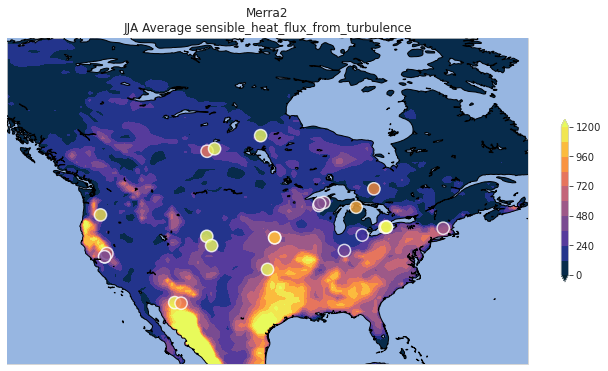

In [33]:
pltvarClimStations(dat= m_h.HFLUX,df=flx_fn, stat_avg=flx_fn.var_sshf, mx=1200,mn=0)

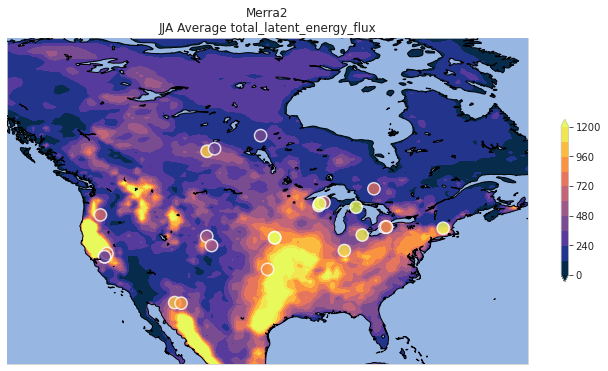

In [34]:
pltvarClimStations(dat= m_l.EFLUX,df=flx_fn, stat_avg=flx_fn.var_slhf, mx=1200,mn=0)

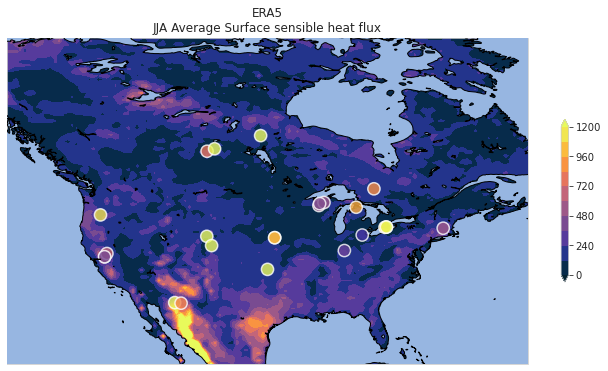

In [38]:
pltvarClimStations(dat= e_h.sshf,df=flx_fn, stat_avg=flx_fn.var_sshf, mx=1200,mn=0,dataset="ERA5")

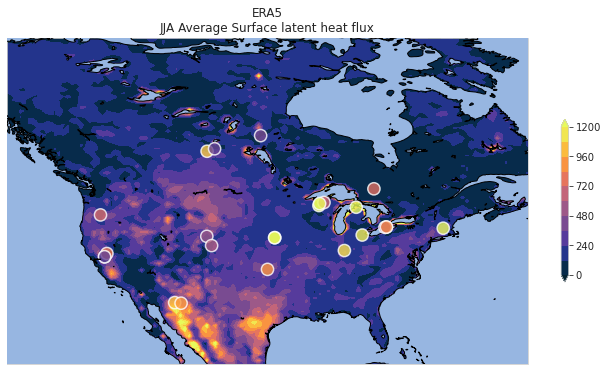

In [37]:
pltvarClimStations(dat= e_l.slhf,df=flx_fn, stat_avg=flx_fn.var_slhf, mx=1200,mn=0,dataset="ERA5")

In [4]:
e_h = xr.open_dataset("/home/data/ERA5/sshf/monthly/sshf.nc").sel(time=slice("1991-01-01", "2014-12-31"))
m_h = xr.open_dataset("/home/data/MERRA2/sshf/monthly/sshf.nc").sel(time=slice("1991-01-01", "2014-12-31"))

e_l = xr.open_dataset("/home/data/ERA5/slhf/monthly/slhf.nc").sel(time=slice("1991-01-01", "2014-12-31"))
m_l = xr.open_dataset("/home/data/MERRA2/slhf/monthly/slhf.nc").sel(time=slice("1991-01-01", "2014-12-31"))

/home/dhruv/my_venv/lib/python3.9/site-packages/cartopy/io/__init__.py:260: DownloadWarning: Downloading: https://naciscdn.org/naturalearth/50m/physical/ne_50m_lakes.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


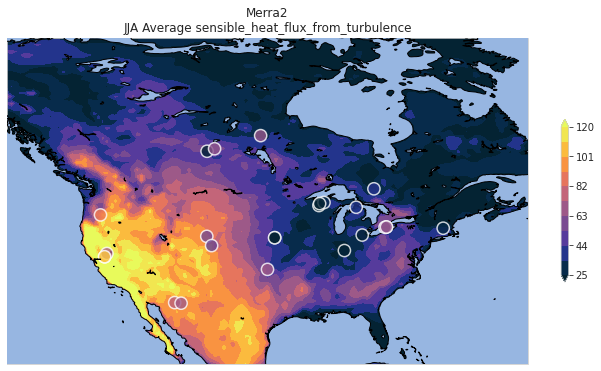

In [16]:
pltClimStations(dat= m_h.HFLUX,df=flx_fn, stat_avg=flx_fn.avg_sshf_stat, mx=120,mn=25)

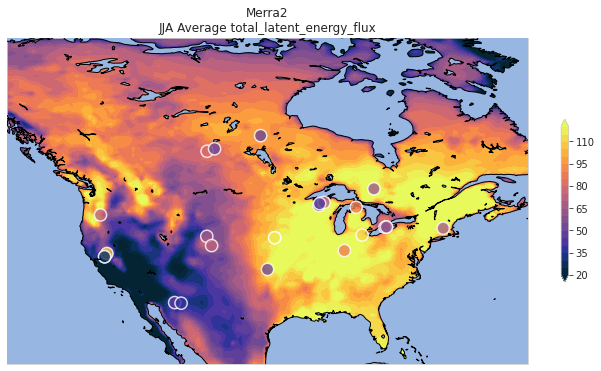

In [22]:
pltClimStations(dat= m_l.EFLUX,df=flx_fn, stat_avg = flx_fn.avg_slhf_stat, mx=120,mn=20,lvn=20)

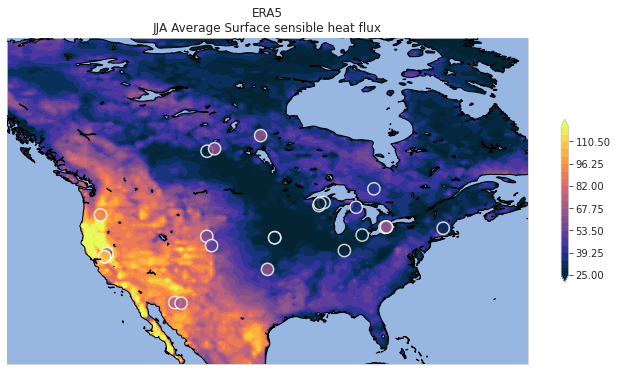

In [23]:
pltClimStations(dat= e_h.sshf,df=flx_fn, stat_avg=flx_fn.avg_sshf_stat, mx=120,mn=25,lvn=20,dataset="ERA5")

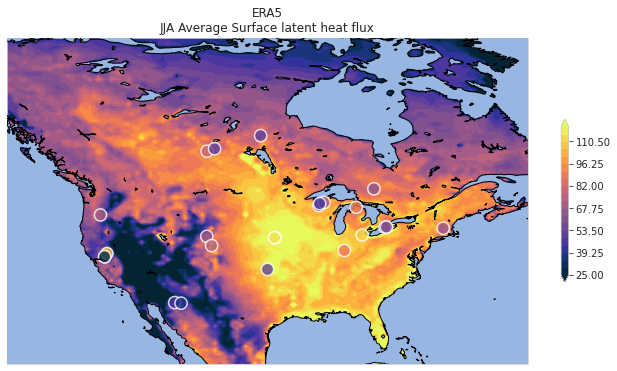

In [24]:
pltClimStations(dat= e_l.slhf,df=flx_fn, stat_avg=flx_fn.avg_slhf_stat, mx=120,mn=25,lvn=20,dataset="ERA5")

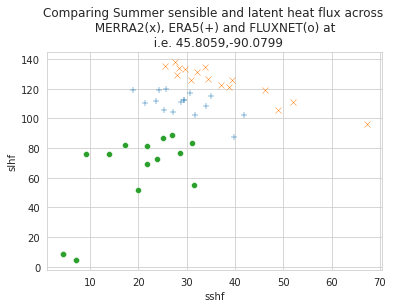

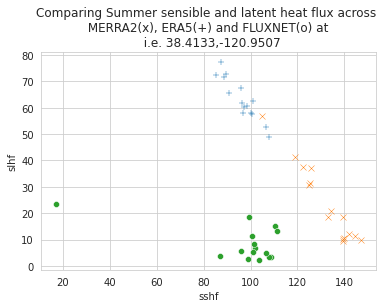

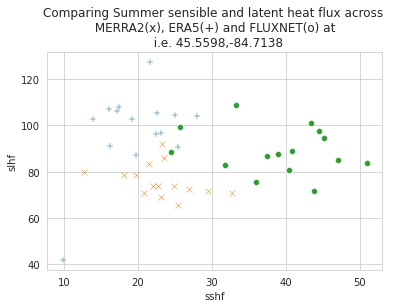

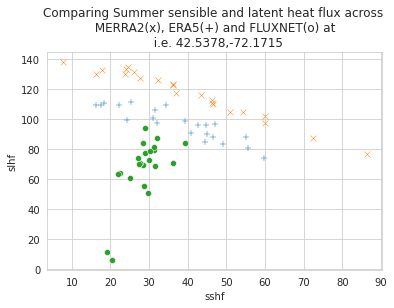

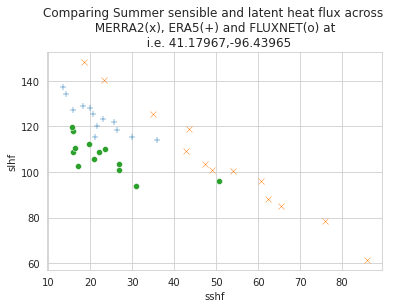

...

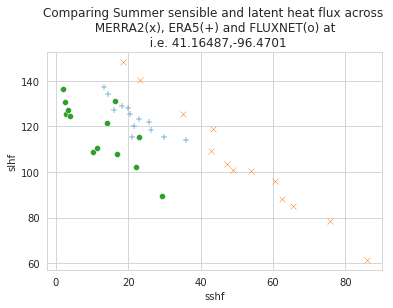

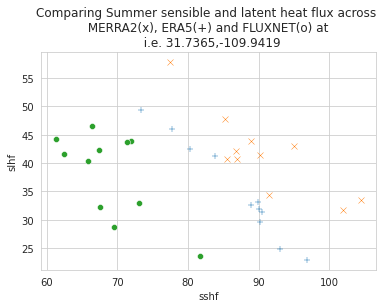

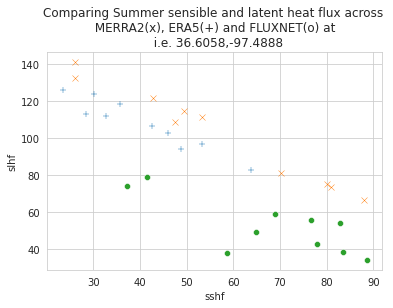

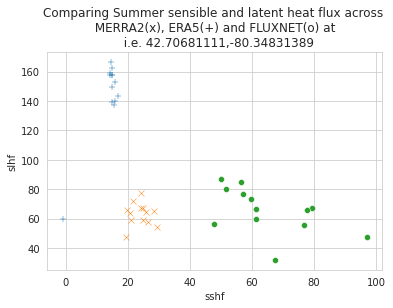

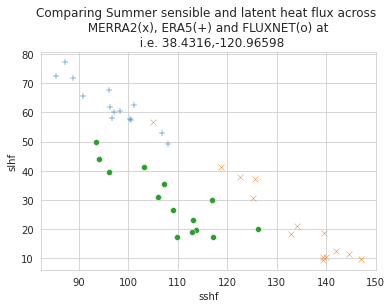

In [13]:
for i in stations:
    temp = xr.open_dataset(i)
    lat, lon = temp.lat.item(), temp.lon.item()
    if (lon > -135 and lon < -60) and (lat > 23 and lat < 70):
        scatter(temp)
        plt.show()

In [4]:
NH_stations = []

for i in stations:
    temp = xr.open_dataset(i)
    lat, lon = temp.lat.item(), temp.lon.item()
    if (lon > -135 and lon < -60) and (lat > 23 and lat < 70):
        NH_stations.append(i)
        print(i)

/home/dhruv/fluxnet/US-WCr.nc
/home/dhruv/fluxnet/US-Var.nc
/home/dhruv/fluxnet/US-UMB.nc
/home/dhruv/fluxnet/US-Ha1.nc
/home/dhruv/fluxnet/US-Ne3.nc
/home/dhruv/fluxnet/US-GLE.nc
/home/dhruv/fluxnet/US-Blo.nc
/home/dhruv/fluxnet/CA-Man.nc
/home/dhruv/fluxnet/US-NR1.nc
/home/dhruv/fluxnet/US-SRM.nc
/home/dhruv/fluxnet/US-Syv.nc
/home/dhruv/fluxnet/CA-Oas.nc
/home/dhruv/fluxnet/CA-Gro.nc
/home/dhruv/fluxnet/CA-TP4.nc
/home/dhruv/fluxnet/CA-TP1.nc
/home/dhruv/fluxnet/US-Me2.nc
/home/dhruv/fluxnet/US-Oho.nc
/home/dhruv/fluxnet/US-Los.nc
/home/dhruv/fluxnet/CA-Obs.nc
/home/dhruv/fluxnet/US-MMS.nc
/home/dhruv/fluxnet/US-Ne2.nc
/home/dhruv/fluxnet/US-Wkg.nc
/home/dhruv/fluxnet/US-ARM.nc
/home/dhruv/fluxnet/CA-TP3.nc
/home/dhruv/fluxnet/US-Ton.nc


In [12]:
xr.open_dataset(stations[0]).lon.item()

3.5957

3 stations for plots: 
1. dry: US-SRM (AZ)
2. transistional: US-Ne2 (NE)
3. wet: US-Ha1 (MA)

In [3]:
srm = xr.open_dataset(outdir+"/US-SRM.nc")
ne2 = xr.open_dataset(outdir+"/US-Ne2.nc")
ha1 = xr.open_dataset(outdir+"/US-Ha1.nc")

In [46]:
ha1.swc

AttributeError: 'Dataset' object has no attribute 'swc'

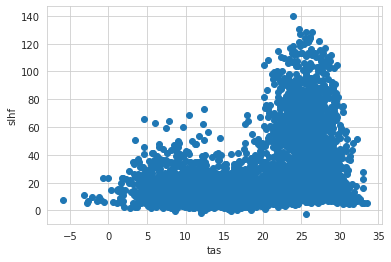

In [36]:
xr.plot.scatter(srm, "tas", "slhf")

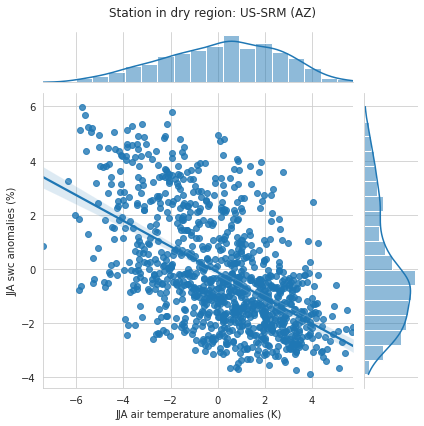

In [41]:
ax = sns.jointplot(x=remove_seasonality_jja(srm.tas), y=remove_seasonality_jja(srm.swc), kind="reg")
ax.set_axis_labels("JJA air temperature anomalies (K)", "JJA swc anomalies (%)")
ax.fig.suptitle("Station in dry region: US-SRM (AZ)")
plt.tight_layout()

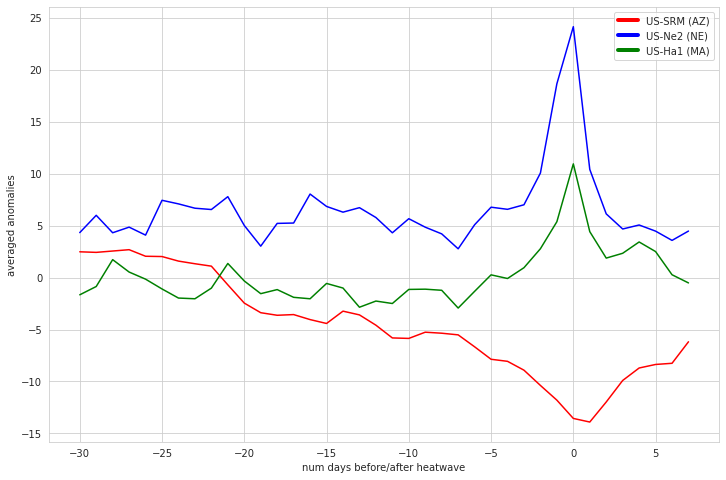

In [48]:
# lag_composite("swc", "% soil moisture in shallowest layer")
lag_composite("slhf")

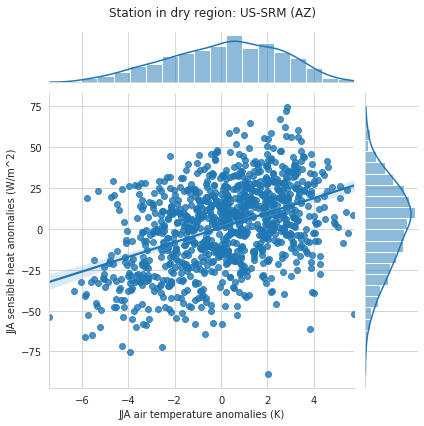

In [38]:
ax = sns.jointplot(x=remove_seasonality_jja(srm.tas), y=remove_seasonality_jja(srm.shflx), kind="reg")
ax.set_axis_labels("JJA air temperature anomalies (K)", "JJA sensible heat anomalies (W/m^2)")
ax.fig.suptitle("Station in dry region: US-SRM (AZ)")
plt.tight_layout()

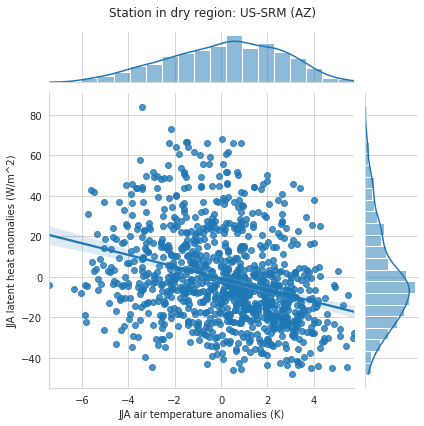

In [51]:
# x = remove_seasonality(srm.tas).sel({'time':srm['time.season']=='JJA'})
# x = remove_seasonality(srm.slhf).sel({'time':srm['time.season']=='JJA'})
ax = sns.jointplot(x=remove_seasonality_jja(srm.tas), y=remove_seasonality_jja(srm.slhf), kind="reg")
# plt.xlabel("Air temperature anomalies") 
# plt.ylabel("Latent heat anomalies")
ax.set_axis_labels("JJA air temperature anomalies (K)", "JJA latent heat anomalies (W/m^2)")
ax.fig.suptitle("Station in dry region: US-SRM (AZ)")
plt.tight_layout()

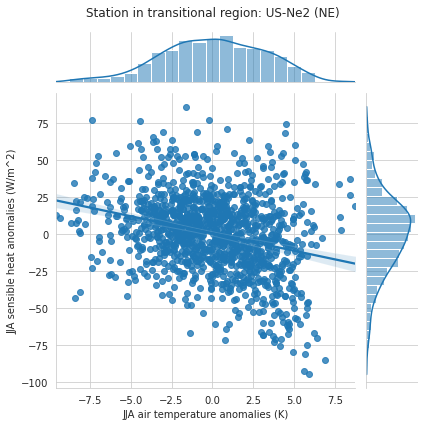

In [52]:
ax = sns.jointplot(x=remove_seasonality_jja(ne2.tas), y=remove_seasonality_jja(ne2.shflx), kind="reg")
ax.set_axis_labels("JJA air temperature anomalies (K)", "JJA sensible heat anomalies (W/m^2)")
ax.fig.suptitle("Station in transitional region: US-Ne2 (NE)")
plt.tight_layout()

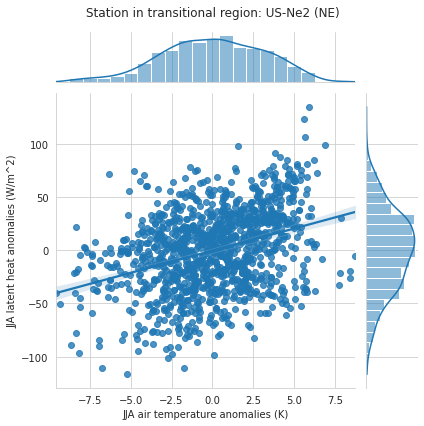

In [53]:
ax = sns.jointplot(x=remove_seasonality_jja(ne2.tas), y=remove_seasonality_jja(ne2.slhf), kind="reg")
ax.set_axis_labels("JJA air temperature anomalies (K)", "JJA latent heat anomalies (W/m^2)")
ax.fig.suptitle("Station in transitional region: US-Ne2 (NE)")
plt.tight_layout()

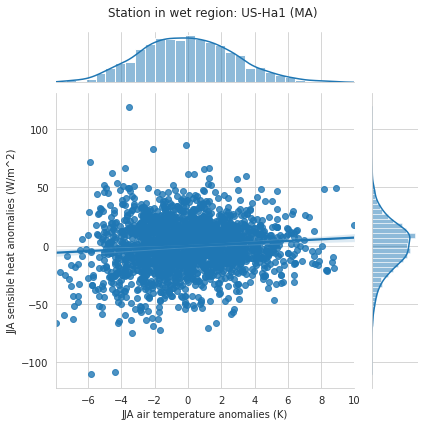

In [54]:
ax = sns.jointplot(x=remove_seasonality_jja(ha1.tas), y=remove_seasonality_jja(ha1.shflx), kind="reg")
ax.set_axis_labels("JJA air temperature anomalies (K)", "JJA sensible heat anomalies (W/m^2)")
ax.fig.suptitle("Station in wet region: US-Ha1 (MA)")
plt.tight_layout()

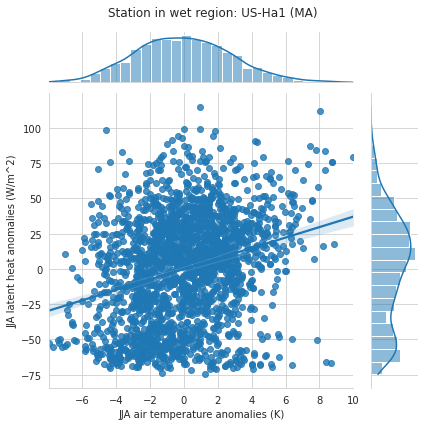

In [55]:
ax = sns.jointplot(x=remove_seasonality_jja(ha1.tas), y=remove_seasonality_jja(ha1.slhf), kind="reg")
ax.set_axis_labels("JJA air temperature anomalies (K)", "JJA latent heat anomalies (W/m^2)")
ax.fig.suptitle("Station in wet region: US-Ha1 (MA)")
plt.tight_layout()

In [4]:
def remove_seasonality(data):
    data = data.sel(time=~((data.time.dt.month==2) & (data.time.dt.day == 29)))
    daystr = xr.DataArray(data.indexes['time'].strftime('%m-%d'), coords = data.time.coords, name="daystr")
    datseason = data.groupby(daystr).mean('time')
    harmonics = filt.calc_season_nharm(datseason, 4, dimtime=0)
    anoms = data.groupby(daystr)-harmonics
    return anoms

def remove_seasonality_jja(data):
    data = data.sel(time=~((data.time.dt.month==2) & (data.time.dt.day == 29)))
    daystr = xr.DataArray(data.indexes['time'].strftime('%m-%d'), coords = data.time.coords, name="daystr")
    datseason = data.groupby(daystr).mean('time')
    harmonics = filt.calc_season_nharm(datseason, 4, dimtime=0)
    anoms = data.groupby(daystr)-harmonics
    return anoms.sel({'time':anoms['time.season']=='JJA'})

In [5]:
def std_anoms(data):
    data = data.sel(time=~((data.time.dt.month==2) & (data.time.dt.day == 29)))
    daystr = xr.DataArray(data.indexes['time'].strftime('%m-%d'), coords = data.time.coords, name="daystr")
    datseason = data.groupby(daystr).mean('time')
    harmonics = filt.calc_season_nharm(datseason, 4, dimtime=0)
    anoms = data.groupby(daystr)-harmonics
    std_anoms = anoms/anoms.std()
    return std_anoms

In [35]:
def lag_composite(var, long_name=""):
    srm_anoms = remove_seasonality(srm[var])
    srm_heatwave_days = srm.tas[srm.tas>=srm.tas.quantile(0.95)].time.values
    
    me2_anoms = remove_seasonality(me2[var])
    me2_heatwave_days = me2.tas[me2.tas>=me2.tas.quantile(0.95)].time.values
    
    tp3_anoms = remove_seasonality(tp3[var])
    tp3_heatwave_days = tp3.tas[tp3.tas>=tp3.tas.quantile(0.95)].time.values

#     anoms = remove_seasonality(data)
#     heatwave_days = data[data>=data.quantile(0.95)].time.values
    
    srm_means = lc_helper(srm_heatwave_days, srm_anoms)
    me2_means = lc_helper(me2_heatwave_days, me2_anoms)
    tp3_means = lc_helper(tp3_heatwave_days, tp3_anoms)
    
    days = range(-30, 8)
    fig, ax = plt.subplots(figsize=(12,8))
    
    plt.plot(days, srm_means, '-r')
    plt.plot(days, me2_means, '-b')
    plt.plot(days, tp3_means, '-g')
    
    custom_lines = [Line2D([0], [0], color='r', lw=4),
                Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4)]

    ax.legend(custom_lines, ['US-SRM (AZ)', 'US-Me2 (OR)', 'CA-TP3'])
    
    ax.set_xlabel("num days before/after heatwave")
    ax.set_ylabel("averaged anomalies")
    
    plt.title(long_name)
    plt.show()
        
#     sns.lineplot(x=range(-30, 8), y=means)

In [36]:
def lc_helper(heatwave_days, anoms):
    means = []
    for i in range(-30, 8):
        vals = []
        for day in heatwave_days:
            prev = day + pd.Timedelta(days=i)
            vals.append(anoms.sel(time=prev).item())
        means.append(np.mean(vals))
    return means

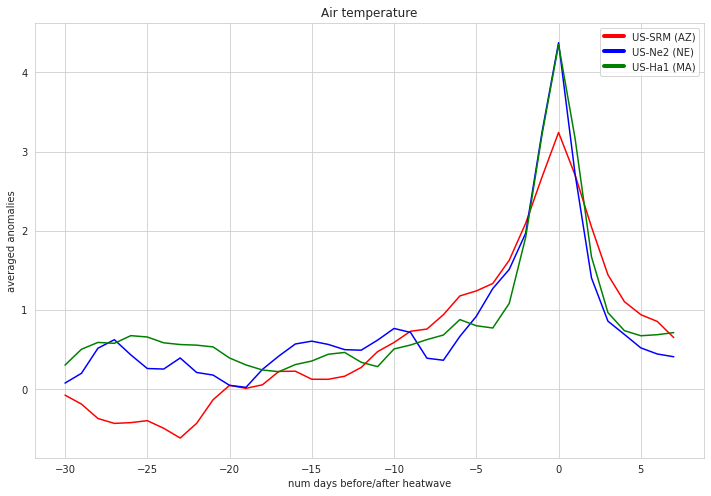

In [64]:
lag_composite("tas", "Air temperature")

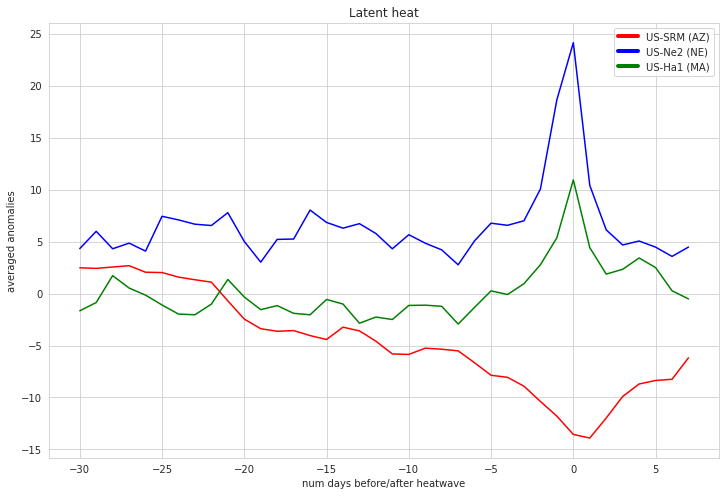

In [67]:
lag_composite("slhf", "Latent heat")

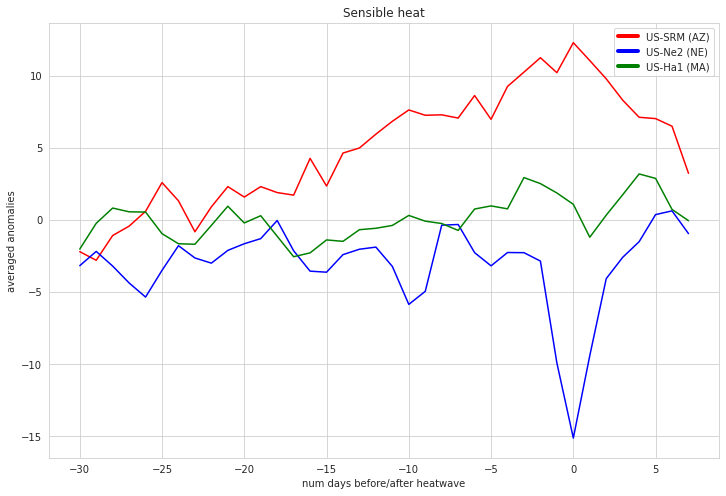

In [68]:
lag_composite("shflx", "Sensible heat")

In [17]:
for i in srm.tas[srm.tas>=srm.tas.quantile(0.95)].time.values:
    j = i-pd.Timedelta(days=1)
    display(srm.tas.sel(time=j))

<xarray.DataArray 'tas' ()>
array(29.148)
Coordinates:
    time     datetime64[ns] 2004-06-02

<xarray.DataArray 'tas' ()>
array(29.837)
Coordinates:
    time     datetime64[ns] 2004-06-03

<xarray.DataArray 'tas' ()>
array(31.208)
Coordinates:
    time     datetime64[ns] 2004-06-04

<xarray.DataArray 'tas' ()>
array(30.354)
Coordinates:
    time     datetime64[ns] 2004-06-05

<xarray.DataArray 'tas' ()>
array(28.596)
Coordinates:
    time     datetime64[ns] 2004-06-25

<xarray.DataArray 'tas' ()>
array(28.526)
Coordinates:
    time     datetime64[ns] 2004-07-06

<xarray.DataArray 'tas' ()>
array(28.418)
Coordinates:
    time     datetime64[ns] 2004-07-19

<xarray.DataArray 'tas' ()>
array(29.808)
Coordinates:
    time     datetime64[ns] 2004-07-20

<xarray.DataArray 'tas' ()>
array(29.95)
Coordinates:
    time     datetime64[ns] 2004-07-21

<xarray.DataArray 'tas' ()>
array(28.64)
Coordinates:
    time     datetime64[ns] 2004-08-09

<xarray.DataArray 'tas' ()>
array(28.064)
Coordinates:
    time     datetime64[ns] 2005-05-20

<xarray.DataArray 'tas' ()>
array(30.303)
Coordinates:
    time     datetime64[ns] 2005-05-21

<xarray.DataArray 'tas' ()>
array(30.598)
Coordinates:
    time     datetime64[ns] 2005-05-22

<xarray.DataArray 'tas' ()>
array(25.602)
Coordinates:
    time     datetime64[ns] 2005-06-13

<xarray.DataArray 'tas' ()>
array(27.296)
Coordinates:
    time     datetime64[ns] 2005-06-18

<xarray.DataArray 'tas' ()>
array(29.586)
Coordinates:
    time     datetime64[ns] 2005-06-19

<xarray.DataArray 'tas' ()>
array(31.557)
Coordinates:
    time     datetime64[ns] 2005-06-20

<xarray.DataArray 'tas' ()>
array(33.018)
Coordinates:
    time     datetime64[ns] 2005-06-21

<xarray.DataArray 'tas' ()>
array(27.946)
Coordinates:
    time     datetime64[ns] 2005-06-24

<xarray.DataArray 'tas' ()>
array(29.988)
Coordinates:
    time     datetime64[ns] 2005-06-25

<xarray.DataArray 'tas' ()>
array(29.752)
Coordinates:
    time     datetime64[ns] 2005-06-26

<xarray.DataArray 'tas' ()>
array(30.518)
Coordinates:
    time     datetime64[ns] 2005-06-27

<xarray.DataArray 'tas' ()>
array(30.945)
Coordinates:
    time     datetime64[ns] 2005-06-28

<xarray.DataArray 'tas' ()>
array(31.001)
Coordinates:
    time     datetime64[ns] 2005-06-29

<xarray.DataArray 'tas' ()>
array(31.672)
Coordinates:
    time     datetime64[ns] 2005-06-30

<xarray.DataArray 'tas' ()>
array(31.165)
Coordinates:
    time     datetime64[ns] 2005-07-01

<xarray.DataArray 'tas' ()>
array(30.856)
Coordinates:
    time     datetime64[ns] 2005-07-02

<xarray.DataArray 'tas' ()>
array(30.89)
Coordinates:
    time     datetime64[ns] 2005-07-03

<xarray.DataArray 'tas' ()>
array(30.949)
Coordinates:
    time     datetime64[ns] 2005-07-04

<xarray.DataArray 'tas' ()>
array(32.419)
Coordinates:
    time     datetime64[ns] 2005-07-05

<xarray.DataArray 'tas' ()>
array(32.144)
Coordinates:
    time     datetime64[ns] 2005-07-06

<xarray.DataArray 'tas' ()>
array(30.38)
Coordinates:
    time     datetime64[ns] 2005-07-07

<xarray.DataArray 'tas' ()>
array(30.374)
Coordinates:
    time     datetime64[ns] 2005-07-08

<xarray.DataArray 'tas' ()>
array(29.723)
Coordinates:
    time     datetime64[ns] 2005-07-09

<xarray.DataArray 'tas' ()>
array(30.076)
Coordinates:
    time     datetime64[ns] 2005-07-10

<xarray.DataArray 'tas' ()>
array(30.445)
Coordinates:
    time     datetime64[ns] 2005-07-11

<xarray.DataArray 'tas' ()>
array(32.102)
Coordinates:
    time     datetime64[ns] 2005-07-12

<xarray.DataArray 'tas' ()>
array(31.89)
Coordinates:
    time     datetime64[ns] 2005-07-13

<xarray.DataArray 'tas' ()>
array(31.126)
Coordinates:
    time     datetime64[ns] 2005-07-14

<xarray.DataArray 'tas' ()>
array(30.905)
Coordinates:
    time     datetime64[ns] 2005-07-15

<xarray.DataArray 'tas' ()>
array(30.17)
Coordinates:
    time     datetime64[ns] 2005-07-16

<xarray.DataArray 'tas' ()>
array(30.87)
Coordinates:
    time     datetime64[ns] 2005-07-17

<xarray.DataArray 'tas' ()>
array(27.981)
Coordinates:
    time     datetime64[ns] 2006-06-02

<xarray.DataArray 'tas' ()>
array(30.306)
Coordinates:
    time     datetime64[ns] 2006-06-03

<xarray.DataArray 'tas' ()>
array(28.857)
Coordinates:
    time     datetime64[ns] 2006-06-12

<xarray.DataArray 'tas' ()>
array(30.06)
Coordinates:
    time     datetime64[ns] 2006-06-13

<xarray.DataArray 'tas' ()>
array(28.143)
Coordinates:
    time     datetime64[ns] 2006-06-17

<xarray.DataArray 'tas' ()>
array(30.019)
Coordinates:
    time     datetime64[ns] 2006-06-18

<xarray.DataArray 'tas' ()>
array(30.9)
Coordinates:
    time     datetime64[ns] 2006-06-19

<xarray.DataArray 'tas' ()>
array(26.965)
Coordinates:
    time     datetime64[ns] 2006-06-22

<xarray.DataArray 'tas' ()>
array(30.065)
Coordinates:
    time     datetime64[ns] 2006-06-23

<xarray.DataArray 'tas' ()>
array(30.321)
Coordinates:
    time     datetime64[ns] 2006-06-24

<xarray.DataArray 'tas' ()>
array(26.438)
Coordinates:
    time     datetime64[ns] 2006-07-08

<xarray.DataArray 'tas' ()>
array(29.955)
Coordinates:
    time     datetime64[ns] 2006-07-09

<xarray.DataArray 'tas' ()>
array(29.854)
Coordinates:
    time     datetime64[ns] 2006-07-10

<xarray.DataArray 'tas' ()>
array(30.326)
Coordinates:
    time     datetime64[ns] 2006-07-11

<xarray.DataArray 'tas' ()>
array(30.884)
Coordinates:
    time     datetime64[ns] 2006-07-12

<xarray.DataArray 'tas' ()>
array(31.081)
Coordinates:
    time     datetime64[ns] 2006-07-13

<xarray.DataArray 'tas' ()>
array(31.041)
Coordinates:
    time     datetime64[ns] 2006-07-14

<xarray.DataArray 'tas' ()>
array(29.123)
Coordinates:
    time     datetime64[ns] 2006-07-19

<xarray.DataArray 'tas' ()>
array(29.765)
Coordinates:
    time     datetime64[ns] 2006-07-20

<xarray.DataArray 'tas' ()>
array(32.269)
Coordinates:
    time     datetime64[ns] 2006-07-21

<xarray.DataArray 'tas' ()>
array(32.988)
Coordinates:
    time     datetime64[ns] 2006-07-22

<xarray.DataArray 'tas' ()>
array(30.532)
Coordinates:
    time     datetime64[ns] 2006-07-23

<xarray.DataArray 'tas' ()>
array(29.034)
Coordinates:
    time     datetime64[ns] 2007-06-14

<xarray.DataArray 'tas' ()>
array(29.999)
Coordinates:
    time     datetime64[ns] 2007-06-15

<xarray.DataArray 'tas' ()>
array(29.941)
Coordinates:
    time     datetime64[ns] 2007-06-16

<xarray.DataArray 'tas' ()>
array(29.297)
Coordinates:
    time     datetime64[ns] 2007-06-18

<xarray.DataArray 'tas' ()>
array(29.375)
Coordinates:
    time     datetime64[ns] 2007-06-19

<xarray.DataArray 'tas' ()>
array(29.416)
Coordinates:
    time     datetime64[ns] 2007-06-20

<xarray.DataArray 'tas' ()>
array(30.441)
Coordinates:
    time     datetime64[ns] 2007-06-21

<xarray.DataArray 'tas' ()>
array(31.161)
Coordinates:
    time     datetime64[ns] 2007-06-22

<xarray.DataArray 'tas' ()>
array(30.313)
Coordinates:
    time     datetime64[ns] 2007-06-23

<xarray.DataArray 'tas' ()>
array(29.685)
Coordinates:
    time     datetime64[ns] 2007-06-24

<xarray.DataArray 'tas' ()>
array(29.954)
Coordinates:
    time     datetime64[ns] 2007-06-25

<xarray.DataArray 'tas' ()>
array(31.162)
Coordinates:
    time     datetime64[ns] 2007-06-26

<xarray.DataArray 'tas' ()>
array(31.057)
Coordinates:
    time     datetime64[ns] 2007-06-27

<xarray.DataArray 'tas' ()>
array(30.884)
Coordinates:
    time     datetime64[ns] 2007-06-28

<xarray.DataArray 'tas' ()>
array(30.677)
Coordinates:
    time     datetime64[ns] 2007-06-29

<xarray.DataArray 'tas' ()>
array(30.628)
Coordinates:
    time     datetime64[ns] 2007-06-30

<xarray.DataArray 'tas' ()>
array(30.999)
Coordinates:
    time     datetime64[ns] 2007-07-01

<xarray.DataArray 'tas' ()>
array(30.975)
Coordinates:
    time     datetime64[ns] 2007-07-02

<xarray.DataArray 'tas' ()>
array(30.834)
Coordinates:
    time     datetime64[ns] 2007-07-03

<xarray.DataArray 'tas' ()>
array(32.23)
Coordinates:
    time     datetime64[ns] 2007-07-04

<xarray.DataArray 'tas' ()>
array(28.598)
Coordinates:
    time     datetime64[ns] 2007-07-14

<xarray.DataArray 'tas' ()>
array(29.371)
Coordinates:
    time     datetime64[ns] 2007-07-15

<xarray.DataArray 'tas' ()>
array(25.675)
Coordinates:
    time     datetime64[ns] 2007-08-11

<xarray.DataArray 'tas' ()>
array(28.25)
Coordinates:
    time     datetime64[ns] 2007-08-28

<xarray.DataArray 'tas' ()>
array(27.623)
Coordinates:
    time     datetime64[ns] 2008-06-13

<xarray.DataArray 'tas' ()>
array(30.178)
Coordinates:
    time     datetime64[ns] 2008-06-14

<xarray.DataArray 'tas' ()>
array(30.42)
Coordinates:
    time     datetime64[ns] 2008-06-15

<xarray.DataArray 'tas' ()>
array(31.068)
Coordinates:
    time     datetime64[ns] 2008-06-16

<xarray.DataArray 'tas' ()>
array(31.462)
Coordinates:
    time     datetime64[ns] 2008-06-17

<xarray.DataArray 'tas' ()>
array(31.29)
Coordinates:
    time     datetime64[ns] 2008-06-18

<xarray.DataArray 'tas' ()>
array(30.167)
Coordinates:
    time     datetime64[ns] 2008-06-19

<xarray.DataArray 'tas' ()>
array(31.609)
Coordinates:
    time     datetime64[ns] 2008-06-20

<xarray.DataArray 'tas' ()>
array(31.516)
Coordinates:
    time     datetime64[ns] 2008-06-21

<xarray.DataArray 'tas' ()>
array(30.443)
Coordinates:
    time     datetime64[ns] 2008-06-22

<xarray.DataArray 'tas' ()>
array(31.363)
Coordinates:
    time     datetime64[ns] 2008-06-23

<xarray.DataArray 'tas' ()>
array(29.161)
Coordinates:
    time     datetime64[ns] 2008-06-29

<xarray.DataArray 'tas' ()>
array(28.879)
Coordinates:
    time     datetime64[ns] 2009-06-23

<xarray.DataArray 'tas' ()>
array(28.623)
Coordinates:
    time     datetime64[ns] 2009-07-10

<xarray.DataArray 'tas' ()>
array(29.644)
Coordinates:
    time     datetime64[ns] 2009-07-11

<xarray.DataArray 'tas' ()>
array(29.276)
Coordinates:
    time     datetime64[ns] 2009-07-17

<xarray.DataArray 'tas' ()>
array(28.527)
Coordinates:
    time     datetime64[ns] 2009-07-26

<xarray.DataArray 'tas' ()>
array(30.962)
Coordinates:
    time     datetime64[ns] 2009-07-27

<xarray.DataArray 'tas' ()>
array(31.572)
Coordinates:
    time     datetime64[ns] 2009-07-28

<xarray.DataArray 'tas' ()>
array(28.966)
Coordinates:
    time     datetime64[ns] 2009-08-01

<xarray.DataArray 'tas' ()>
array(30.064)
Coordinates:
    time     datetime64[ns] 2009-08-02

<xarray.DataArray 'tas' ()>
array(30.591)
Coordinates:
    time     datetime64[ns] 2009-08-03

<xarray.DataArray 'tas' ()>
array(29.247)
Coordinates:
    time     datetime64[ns] 2009-08-05

<xarray.DataArray 'tas' ()>
array(28.96)
Coordinates:
    time     datetime64[ns] 2009-08-17

<xarray.DataArray 'tas' ()>
array(29.248)
Coordinates:
    time     datetime64[ns] 2009-08-27

<xarray.DataArray 'tas' ()>
array(30.809)
Coordinates:
    time     datetime64[ns] 2009-08-28

<xarray.DataArray 'tas' ()>
array(30.095)
Coordinates:
    time     datetime64[ns] 2009-08-29

<xarray.DataArray 'tas' ()>
array(28.405)
Coordinates:
    time     datetime64[ns] 2010-06-05

<xarray.DataArray 'tas' ()>
array(29.369)
Coordinates:
    time     datetime64[ns] 2010-06-06

<xarray.DataArray 'tas' ()>
array(27.675)
Coordinates:
    time     datetime64[ns] 2010-06-22

<xarray.DataArray 'tas' ()>
array(29.63)
Coordinates:
    time     datetime64[ns] 2010-06-23

<xarray.DataArray 'tas' ()>
array(31.264)
Coordinates:
    time     datetime64[ns] 2010-06-24

<xarray.DataArray 'tas' ()>
array(30.446)
Coordinates:
    time     datetime64[ns] 2010-06-25

<xarray.DataArray 'tas' ()>
array(28.79)
Coordinates:
    time     datetime64[ns] 2010-06-27

<xarray.DataArray 'tas' ()>
array(29.852)
Coordinates:
    time     datetime64[ns] 2010-06-28

<xarray.DataArray 'tas' ()>
array(30.073)
Coordinates:
    time     datetime64[ns] 2010-06-29

<xarray.DataArray 'tas' ()>
array(30.656)
Coordinates:
    time     datetime64[ns] 2010-06-30

<xarray.DataArray 'tas' ()>
array(30.418)
Coordinates:
    time     datetime64[ns] 2010-07-01

<xarray.DataArray 'tas' ()>
array(31.699)
Coordinates:
    time     datetime64[ns] 2010-07-02

<xarray.DataArray 'tas' ()>
array(29.007)
Coordinates:
    time     datetime64[ns] 2010-07-07

<xarray.DataArray 'tas' ()>
array(30.241)
Coordinates:
    time     datetime64[ns] 2010-07-08

<xarray.DataArray 'tas' ()>
array(28.016)
Coordinates:
    time     datetime64[ns] 2010-07-14

<xarray.DataArray 'tas' ()>
array(28.517)
Coordinates:
    time     datetime64[ns] 2010-07-18

<xarray.DataArray 'tas' ()>
array(27.504)
Coordinates:
    time     datetime64[ns] 2010-09-17

<xarray.DataArray 'tas' ()>
array(29.326)
Coordinates:
    time     datetime64[ns] 2010-09-18

<xarray.DataArray 'tas' ()>
array(25.64)
Coordinates:
    time     datetime64[ns] 2010-09-29

<xarray.DataArray 'tas' ()>
array(27.109)
Coordinates:
    time     datetime64[ns] 2011-06-14

<xarray.DataArray 'tas' ()>
array(29.398)
Coordinates:
    time     datetime64[ns] 2011-06-15

<xarray.DataArray 'tas' ()>
array(30.161)
Coordinates:
    time     datetime64[ns] 2011-06-16

<xarray.DataArray 'tas' ()>
array(28.349)
Coordinates:
    time     datetime64[ns] 2011-06-21

<xarray.DataArray 'tas' ()>
array(30.451)
Coordinates:
    time     datetime64[ns] 2011-06-22

<xarray.DataArray 'tas' ()>
array(30.412)
Coordinates:
    time     datetime64[ns] 2011-06-23

<xarray.DataArray 'tas' ()>
array(30.466)
Coordinates:
    time     datetime64[ns] 2011-06-24

<xarray.DataArray 'tas' ()>
array(30.963)
Coordinates:
    time     datetime64[ns] 2011-06-25

<xarray.DataArray 'tas' ()>
array(31.715)
Coordinates:
    time     datetime64[ns] 2011-06-26

<xarray.DataArray 'tas' ()>
array(32.856)
Coordinates:
    time     datetime64[ns] 2011-06-27

<xarray.DataArray 'tas' ()>
array(32.631)
Coordinates:
    time     datetime64[ns] 2011-06-28

<xarray.DataArray 'tas' ()>
array(31.036)
Coordinates:
    time     datetime64[ns] 2011-06-29

<xarray.DataArray 'tas' ()>
array(30.331)
Coordinates:
    time     datetime64[ns] 2011-06-30

<xarray.DataArray 'tas' ()>
array(31.301)
Coordinates:
    time     datetime64[ns] 2011-07-01

<xarray.DataArray 'tas' ()>
array(27.48)
Coordinates:
    time     datetime64[ns] 2011-08-01

<xarray.DataArray 'tas' ()>
array(28.254)
Coordinates:
    time     datetime64[ns] 2011-08-23

<xarray.DataArray 'tas' ()>
array(29.609)
Coordinates:
    time     datetime64[ns] 2011-08-24

<xarray.DataArray 'tas' ()>
array(29.371)
Coordinates:
    time     datetime64[ns] 2011-08-25

<xarray.DataArray 'tas' ()>
array(27.959)
Coordinates:
    time     datetime64[ns] 2011-08-28

<xarray.DataArray 'tas' ()>
array(29.333)
Coordinates:
    time     datetime64[ns] 2011-08-29

<xarray.DataArray 'tas' ()>
array(28.614)
Coordinates:
    time     datetime64[ns] 2011-08-31

<xarray.DataArray 'tas' ()>
array(25.591)
Coordinates:
    time     datetime64[ns] 2012-05-31

<xarray.DataArray 'tas' ()>
array(29.164)
Coordinates:
    time     datetime64[ns] 2012-06-17

<xarray.DataArray 'tas' ()>
array(29.656)
Coordinates:
    time     datetime64[ns] 2012-06-18

<xarray.DataArray 'tas' ()>
array(28.661)
Coordinates:
    time     datetime64[ns] 2012-06-20

<xarray.DataArray 'tas' ()>
array(29.478)
Coordinates:
    time     datetime64[ns] 2012-06-21

<xarray.DataArray 'tas' ()>
array(30.404)
Coordinates:
    time     datetime64[ns] 2012-06-22

<xarray.DataArray 'tas' ()>
array(28.755)
Coordinates:
    time     datetime64[ns] 2012-06-28

<xarray.DataArray 'tas' ()>
array(30.218)
Coordinates:
    time     datetime64[ns] 2012-06-29

<xarray.DataArray 'tas' ()>
array(29.781)
Coordinates:
    time     datetime64[ns] 2012-06-30

<xarray.DataArray 'tas' ()>
array(26.952)
Coordinates:
    time     datetime64[ns] 2012-07-08

<xarray.DataArray 'tas' ()>
array(29.213)
Coordinates:
    time     datetime64[ns] 2012-08-07

<xarray.DataArray 'tas' ()>
array(29.708)
Coordinates:
    time     datetime64[ns] 2012-08-08

<xarray.DataArray 'tas' ()>
array(29.809)
Coordinates:
    time     datetime64[ns] 2012-08-09

<xarray.DataArray 'tas' ()>
array(28.706)
Coordinates:
    time     datetime64[ns] 2012-08-11

<xarray.DataArray 'tas' ()>
array(30.785)
Coordinates:
    time     datetime64[ns] 2012-08-12

<xarray.DataArray 'tas' ()>
array(28.565)
Coordinates:
    time     datetime64[ns] 2013-06-01

<xarray.DataArray 'tas' ()>
array(28.255)
Coordinates:
    time     datetime64[ns] 2013-06-06

<xarray.DataArray 'tas' ()>
array(29.906)
Coordinates:
    time     datetime64[ns] 2013-06-07

<xarray.DataArray 'tas' ()>
array(28.595)
Coordinates:
    time     datetime64[ns] 2013-06-09

<xarray.DataArray 'tas' ()>
array(29.837)
Coordinates:
    time     datetime64[ns] 2013-06-10

<xarray.DataArray 'tas' ()>
array(30.051)
Coordinates:
    time     datetime64[ns] 2013-06-11

<xarray.DataArray 'tas' ()>
array(29.219)
Coordinates:
    time     datetime64[ns] 2013-06-15

<xarray.DataArray 'tas' ()>
array(28.992)
Coordinates:
    time     datetime64[ns] 2013-06-18

<xarray.DataArray 'tas' ()>
array(28.973)
Coordinates:
    time     datetime64[ns] 2013-06-27

<xarray.DataArray 'tas' ()>
array(31.685)
Coordinates:
    time     datetime64[ns] 2013-06-28

<xarray.DataArray 'tas' ()>
array(33.529)
Coordinates:
    time     datetime64[ns] 2013-06-29

<xarray.DataArray 'tas' ()>
array(30.933)
Coordinates:
    time     datetime64[ns] 2013-06-30

<xarray.DataArray 'tas' ()>
array(28.048)
Coordinates:
    time     datetime64[ns] 2013-07-02

<xarray.DataArray 'tas' ()>
array(30.113)
Coordinates:
    time     datetime64[ns] 2013-07-03

<xarray.DataArray 'tas' ()>
array(28.473)
Coordinates:
    time     datetime64[ns] 2013-07-07

<xarray.DataArray 'tas' ()>
array(28.834)
Coordinates:
    time     datetime64[ns] 2013-08-15

<xarray.DataArray 'tas' ()>
array(29.361)
Coordinates:
    time     datetime64[ns] 2013-08-16

<xarray.DataArray 'tas' ()>
array(28.396)
Coordinates:
    time     datetime64[ns] 2014-06-01

<xarray.DataArray 'tas' ()>
array(29.821)
Coordinates:
    time     datetime64[ns] 2014-06-02

<xarray.DataArray 'tas' ()>
array(29.772)
Coordinates:
    time     datetime64[ns] 2014-06-03

<xarray.DataArray 'tas' ()>
array(29.628)
Coordinates:
    time     datetime64[ns] 2014-06-04

<xarray.DataArray 'tas' ()>
array(29.054)
Coordinates:
    time     datetime64[ns] 2014-06-10

<xarray.DataArray 'tas' ()>
array(29.69)
Coordinates:
    time     datetime64[ns] 2014-06-11

<xarray.DataArray 'tas' ()>
array(29.791)
Coordinates:
    time     datetime64[ns] 2014-06-12

<xarray.DataArray 'tas' ()>
array(27.923)
Coordinates:
    time     datetime64[ns] 2014-06-15

<xarray.DataArray 'tas' ()>
array(28.286)
Coordinates:
    time     datetime64[ns] 2014-06-28

<xarray.DataArray 'tas' ()>
array(30.031)
Coordinates:
    time     datetime64[ns] 2014-06-29

<xarray.DataArray 'tas' ()>
array(30.091)
Coordinates:
    time     datetime64[ns] 2014-06-30

<xarray.DataArray 'tas' ()>
array(28.099)
Coordinates:
    time     datetime64[ns] 2014-07-21

<xarray.DataArray 'tas' ()>
array(30.058)
Coordinates:
    time     datetime64[ns] 2014-07-22

<xarray.DataArray 'tas' ()>
array(30.335)
Coordinates:
    time     datetime64[ns] 2014-07-23

In [12]:
srm.tas[srm.tas>=srm.tas.quantile(0.95)].time.values

array(['2004-06-03T00:00:00.000000000', '2004-06-04T00:00:00.000000000',
       '2004-06-05T00:00:00.000000000', '2004-06-06T00:00:00.000000000',
       '2004-06-26T00:00:00.000000000', '2004-07-07T00:00:00.000000000',
       '2004-07-20T00:00:00.000000000', '2004-07-21T00:00:00.000000000',
       '2004-07-22T00:00:00.000000000', '2004-08-10T00:00:00.000000000',
       '2005-05-21T00:00:00.000000000', '2005-05-22T00:00:00.000000000',
       '2005-05-23T00:00:00.000000000', '2005-06-14T00:00:00.000000000',
       '2005-06-19T00:00:00.000000000', '2005-06-20T00:00:00.000000000',
       '2005-06-21T00:00:00.000000000', '2005-06-22T00:00:00.000000000',
       '2005-06-25T00:00:00.000000000', '2005-06-26T00:00:00.000000000',
       '2005-06-27T00:00:00.000000000', '2005-06-28T00:00:00.000000000',
       '2005-06-29T00:00:00.000000000', '2005-06-30T00:00:00.000000000',
       '2005-07-01T00:00:00.000000000', '2005-07-02T00:00:00.000000000',
       '2005-07-03T00:00:00.000000000', '2005-07-04

In [7]:
metadata = pd.read_excel("/home/data/FLUXNET2015/FLX_AA-Flx_BIF_ALL_20200501/FLX_AA-Flx_BIF_DD_20200501.xlsx")

In [209]:
np.unique(metadata[(metadata.SITE_ID == "US-SRM") & (metadata.VARIABLE == "VAR_INFO_HEIGHT")].DATAVALUE)

array(['-0.05', '7.82'], dtype=object)

In [206]:
pd.set_option('display.max_rows', 2000)

display(metadata[(metadata.SITE_ID == "US-Me2")])

,SITE_ID,GROUP_ID,VARIABLE_GROUP,VARIABLE,DATAVALUE
500662,US-Me2,12961,GRP_ACKNOWLEDGEMENT,ACKNOWLEDGEMENT,The Metolius AmeriFlux research was supported ...
500663,US-Me2,12962,GRP_CLIM_AVG,MAT,6.28
500664,US-Me2,12962,GRP_CLIM_AVG,MAP,523
500665,US-Me2,27000394,GRP_COUNTRY,COUNTRY,USA
500666,US-Me2,81679,GRP_DOI,DOI,10.18140/FLX/1440079
500667,US-Me2,81679,GRP_DOI,DOI_DATAPRODUCT,FLUXNET2015
500668,US-Me2,32114,GRP_DOI_CONTRIBUTOR,DOI_CONTRIBUTOR_NAME,Bev Law
500669,US-Me2,32114,GRP_DOI_CONTRIBUTOR,DOI_CONTRIBUTOR_ROLE,Author
500670,US-Me2,32114,GRP_DOI_CONTRIBUTOR,DOI_CONTRIBUTOR_EMAIL,bev.law@oregonstate.edu
500671,US-Me2,32114,GRP_DOI_CONTRIBUTOR,DOI_CONTRIBUTOR_INSTITUTION,Oregon State University


In [183]:
np.unique(metadata[(metadata.SITE_ID == "CA-TP3") & (metadata.VARIABLE == "VAR_INFO_HEIGHT")].DATAVALUE)

array(['-0.02', '-0.05', '16', '20'], dtype=object)

In [219]:
srm['swc'] = (srm.swc/100)*1000*0.05
me2['swc'] = (me2.swc/100)*1000*0.10
tp3['swc'] = (tp3.swc/100)*1000*0.05

Sites with good soil moisture: SRM, WCr, Ton, TP3, Me2 (**10 cm instead of 5**)

Sites with good net rad: SRM, UMB, Ton, TP3, Me2

In [84]:
gro = xr.open_dataset(outdir+"CA-Gro.nc")

In [92]:
wcr = xr.open_dataset(outdir+"US-WCr.nc")

In [100]:
umb = xr.open_dataset(outdir+"US-UMB.nc")

In [103]:
gle = xr.open_dataset(outdir+"US-GLE.nc")

In [143]:
ton = xr.open_dataset(outdir+"US-Ton.nc")
nr1 = xr.open_dataset(outdir+"US-NR1.nc")

In [5]:
tp3 = xr.open_dataset(outdir+"CA-TP3.nc")

In [125]:
tp1 = xr.open_dataset(outdir+"CA-TP1.nc")

In [4]:
me2 = xr.open_dataset(outdir+"US-Me2.nc")

In [11]:
def jointpdf(data, var1, var2, xlabel="", ylabel="", suptitle=""):
    ax = sns.jointplot(x=remove_seasonality_jja(data[var1]), y=remove_seasonality_jja(data[var2]), kind="reg")
    ax.set_axis_labels(xlabel, ylabel)
    ax.fig.suptitle(suptitle)
    plt.tight_layout()

In [19]:
remove_seasonality_jja(srm.tas).where()

<xarray.DataArray (time: 1012)>
array([1.99569665, 3.21376812, 3.77667324, ..., 2.69024984, 4.32830739,
       3.55046534])
Coordinates:
  * time     (time) datetime64[ns] 2004-06-01 2004-06-02 ... 2014-08-31
    daystr   (time) <U5 '06-01' '06-02' '06-03' ... '08-29' '08-30' '08-31'

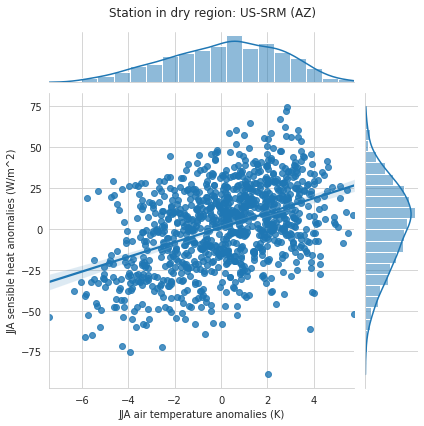

In [192]:
jointpdf(srm, "tas", "shflx", "JJA air temperature anomalies (K)", "JJA sensible heat anomalies (W/m^2)",
        "Station in dry region: US-SRM (AZ)")

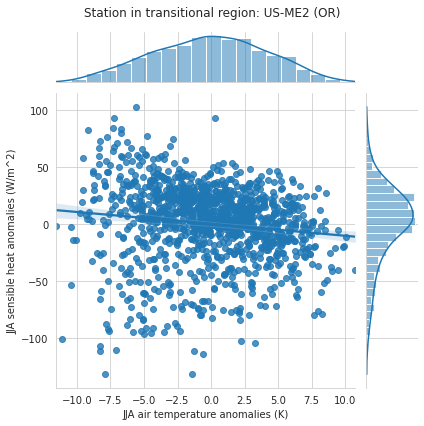

In [193]:
jointpdf(me2, "tas", "shflx", "JJA air temperature anomalies (K)", "JJA sensible heat anomalies (W/m^2)",
        "Station in transitional region: US-ME2 (OR)")

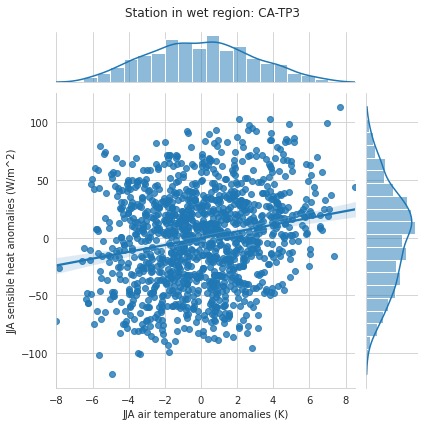

In [194]:
jointpdf(tp3, "tas", "shflx", "JJA air temperature anomalies (K)", "JJA sensible heat anomalies (W/m^2)",
        "Station in wet region: CA-TP3")

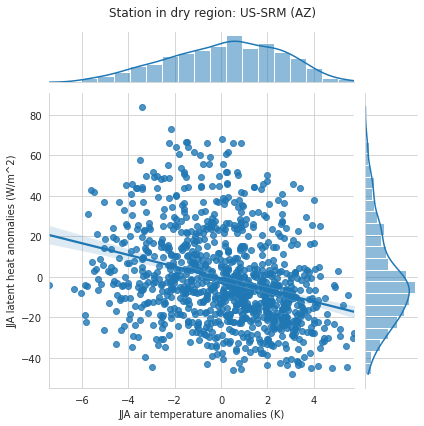

In [195]:
jointpdf(srm, "tas", "slhf", "JJA air temperature anomalies (K)", "JJA latent heat anomalies (W/m^2)",
        "Station in dry region: US-SRM (AZ)")

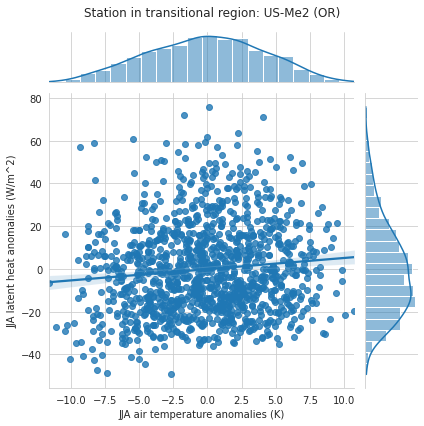

In [197]:
jointpdf(me2, "tas", "slhf", "JJA air temperature anomalies (K)", "JJA latent heat anomalies (W/m^2)",
        "Station in transitional region: US-Me2 (OR)")

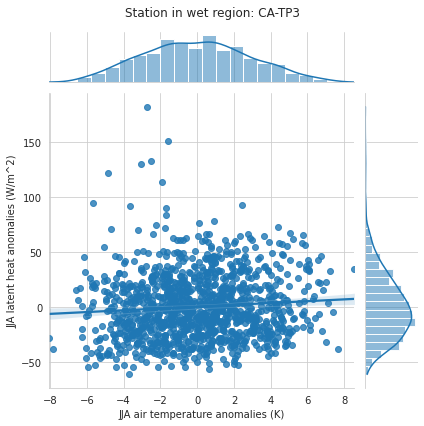

In [199]:
jointpdf(tp3, "tas", "slhf", "JJA air temperature anomalies (K)", "JJA latent heat anomalies (W/m^2)",
        "Station in wet region: CA-TP3")

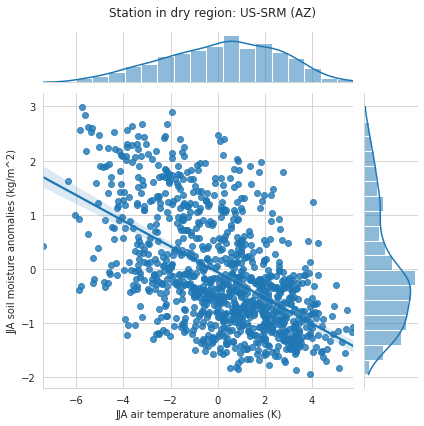

In [212]:
jointpdf(srm, "tas", "swc", "JJA air temperature anomalies (K)", "JJA soil moisture anomalies (kg/m^2)",
        "Station in dry region: US-SRM (AZ)")

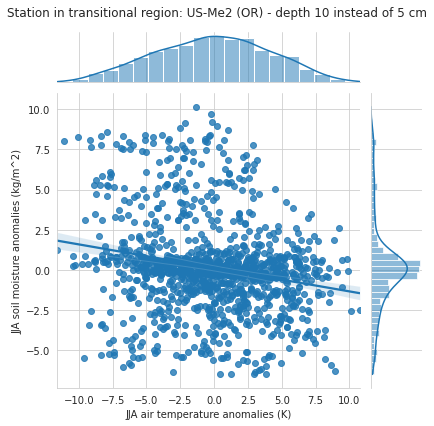

In [220]:
jointpdf(me2, "tas", "swc", "JJA air temperature anomalies (K)", "JJA soil moisture anomalies (kg/m^2)",
        "Station in transitional region: US-Me2 (OR) - depth 10 instead of 5 cm")

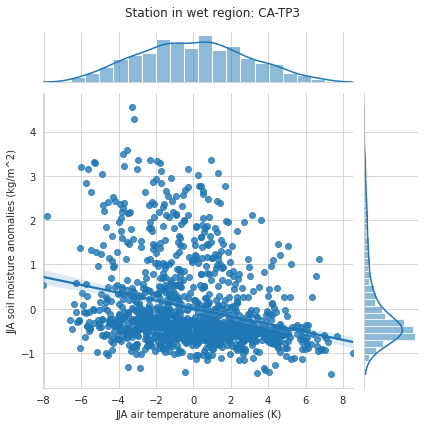

In [214]:
jointpdf(tp3, "tas", "swc", "JJA air temperature anomalies (K)", "JJA soil moisture anomalies (kg/m^2)",
        "Station in wet region: CA-TP3")

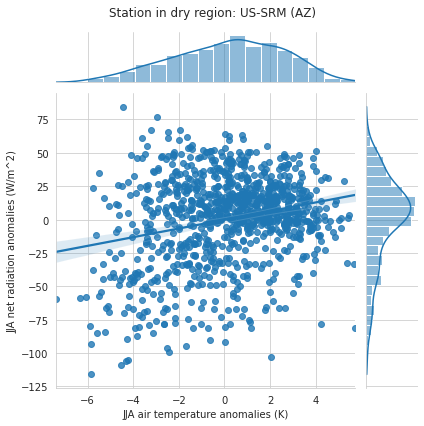

In [40]:
jointpdf(srm, "tas", "netrad", "JJA air temperature anomalies (K)", "JJA net radiation anomalies (W/m^2)",
        "Station in dry region: US-SRM (AZ)")

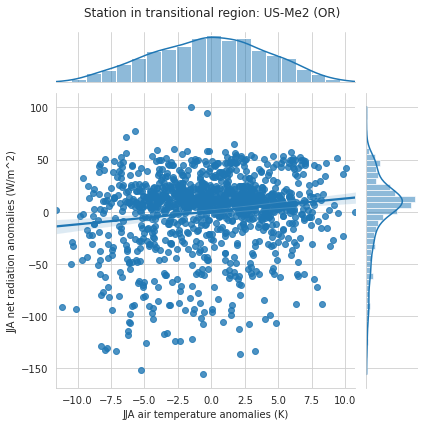

In [41]:
jointpdf(me2, "tas", "netrad", "JJA air temperature anomalies (K)", "JJA net radiation anomalies (W/m^2)",
        "Station in transitional region: US-Me2 (OR)")

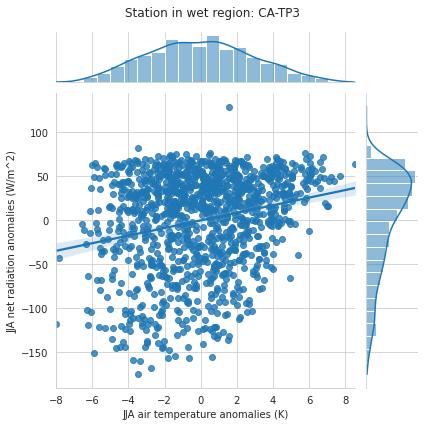

In [42]:
jointpdf(tp3, "tas", "netrad", "JJA air temperature anomalies (K)", "JJA net radiation anomalies (W/m^2)",
        "Station in wet region: CA-TP3")

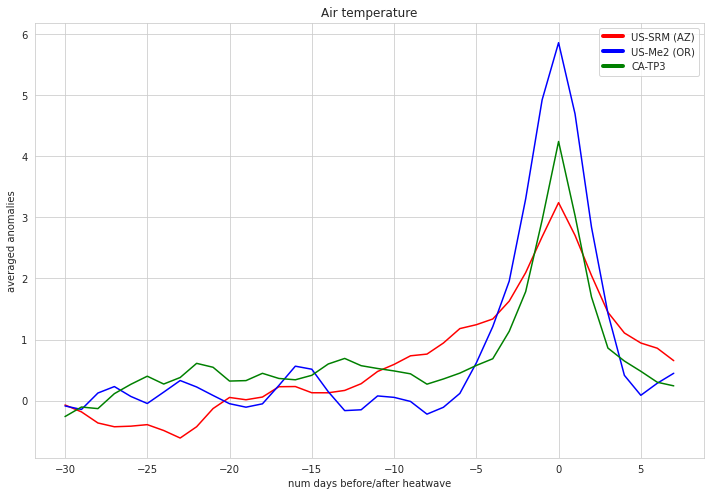

In [200]:
# srm = srm.where(srm.netrad>-2000)
# ne2 = ne2.where(ne2.netrad>-2000)
# gro = gro.where(gro.netrad>-2000)

lag_composite("tas", "Air temperature")

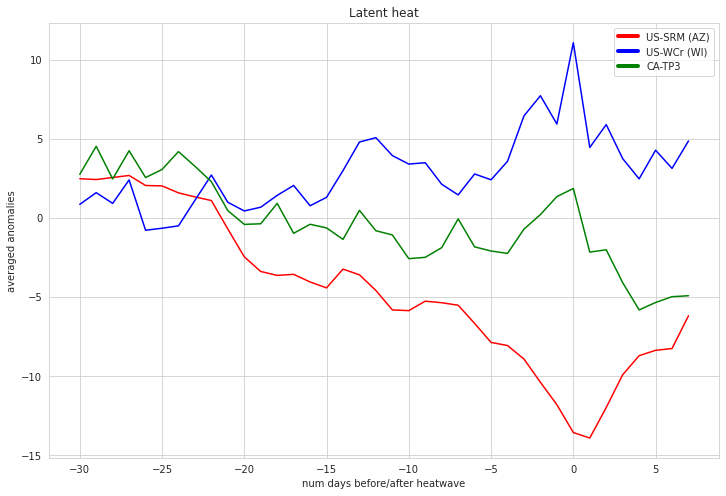

In [158]:
lag_composite("slhf", "Latent heat")

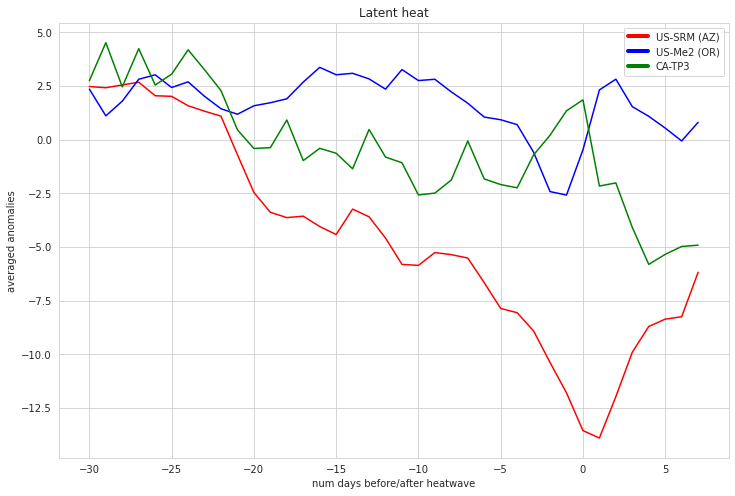

In [201]:
lag_composite("slhf", "Latent heat")

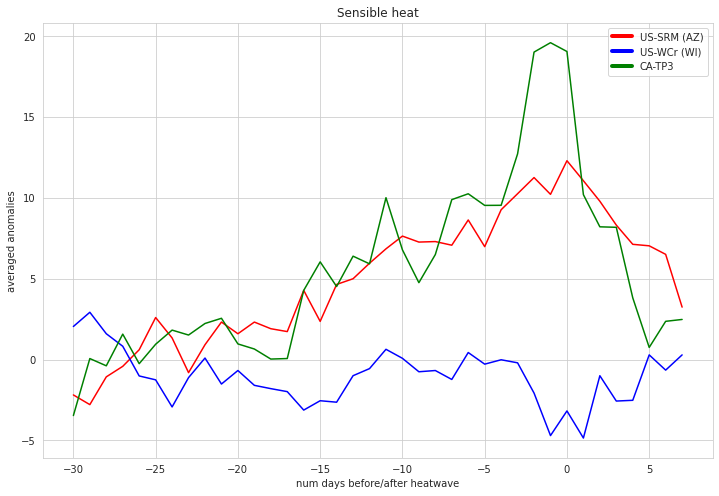

In [159]:
lag_composite("shflx", "Sensible heat")

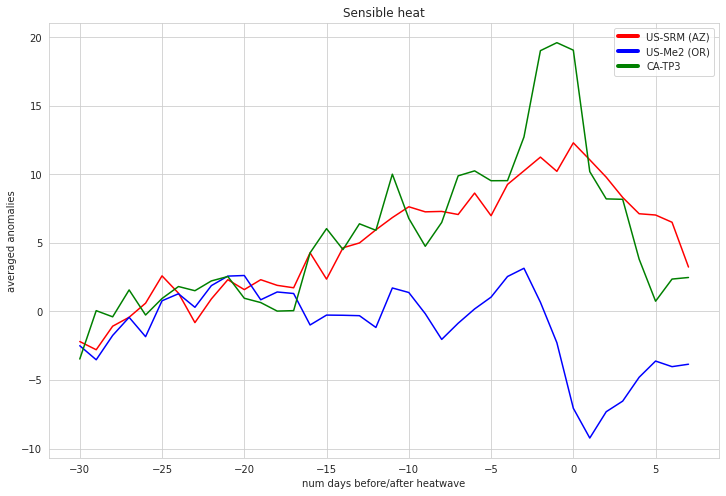

In [202]:
lag_composite("shflx", "Sensible heat")

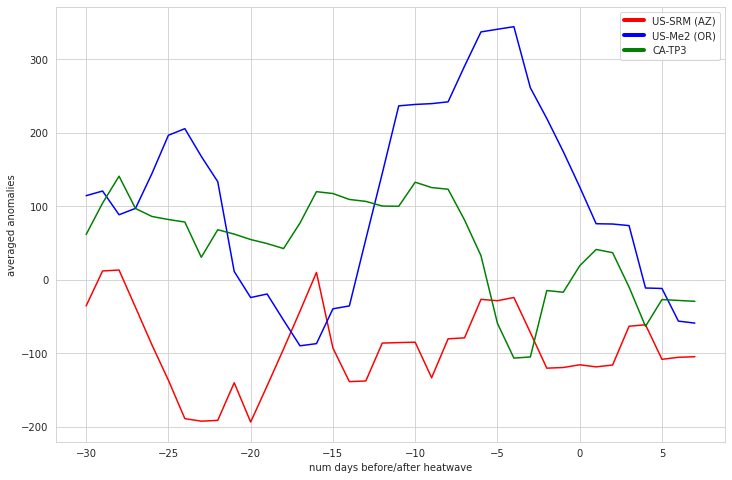

In [170]:
lag_composite("netrad")

In [49]:
srm = xr.open_dataset(outdir+"US-SRM.nc")
me2 = xr.open_dataset(outdir+"US-Me2.nc")
tp3 = xr.open_dataset(outdir+"CA-TP3.nc")

In [47]:
srm = srm.where(srm.netrad>-2000).fillna(srm.netrad.mean())
me2 = me2.where(me2.netrad>-2000).fillna(me2.netrad.mean())
tp3 = tp3.where(tp3.netrad>-2000).fillna(tp3.netrad.mean())

# srm = srm.where(srm.netrad>-2000)
# me2 = me2.where(me2.netrad>-2000)
# tp3 = tp3.where(tp3.netrad>-2000)

In [22]:
me2.netrad.mean().item()+1.5*me2.netrad.std().item()

181.04061203415796

In [15]:
min(me2.netrad), max(me2.netrad)

(<xarray.DataArray 'netrad' ()>
 array(-39.03125)
 Coordinates:
     time     datetime64[ns] 2006-01-03,
 <xarray.DataArray 'netrad' ()>
 array(231.26041667)
 Coordinates:
     time     datetime64[ns] 2003-07-07)

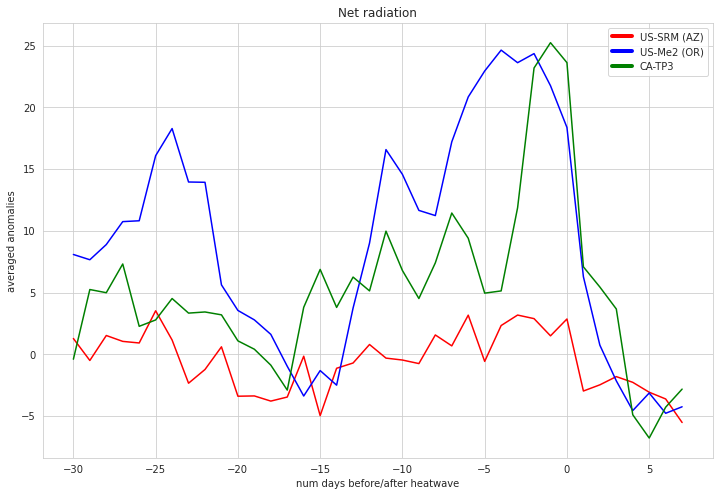

In [45]:
lag_composite("netrad", "Net radiation")

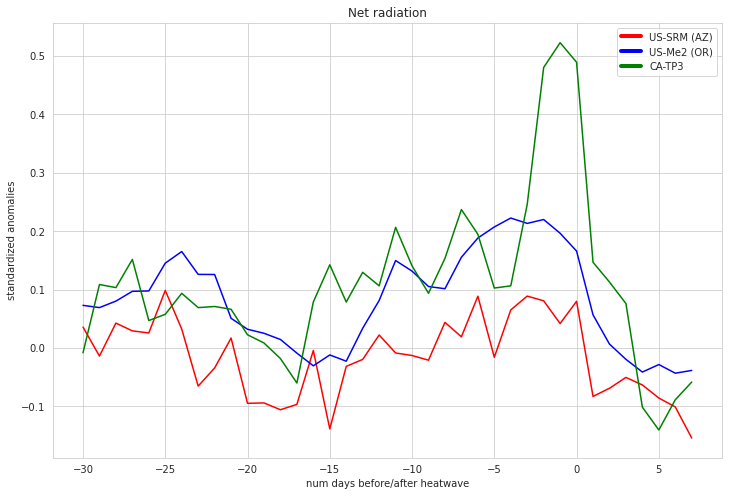

In [48]:
lag_composite("netrad", "Net radiation")

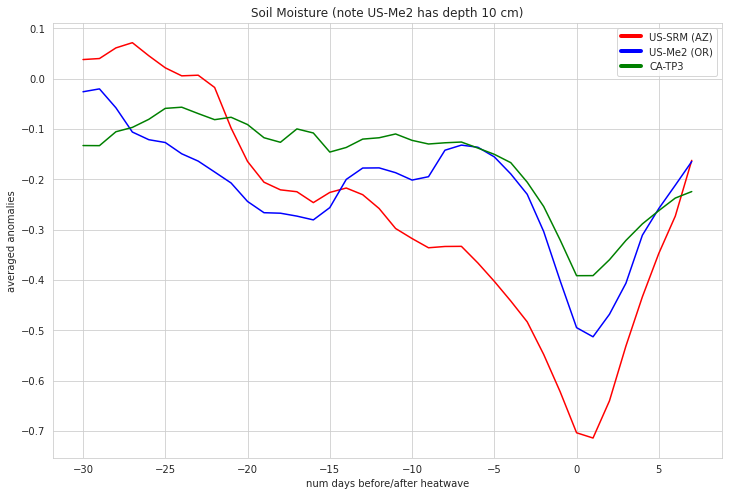

In [221]:
lag_composite("swc", "Soil Moisture (note US-Me2 has depth 10 cm)")

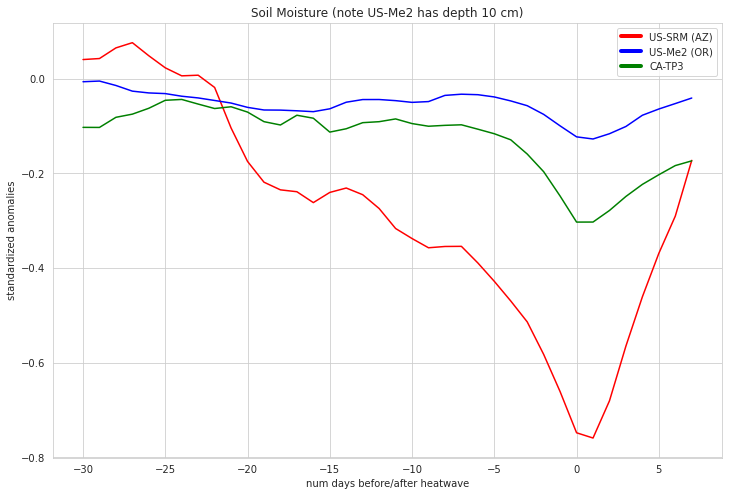

In [50]:
lag_composite("swc", "Soil Moisture (note US-Me2 has depth 10 cm)")

In [9]:
def lag_composite(var, long_name=""):
    srm_anoms = std_anoms(srm[var])
    srm_heatwave_days = srm.tas[srm.tas>=srm.tas.quantile(0.95)].time.values
    
    me2_anoms = std_anoms(me2[var])
    me2_heatwave_days = me2.tas[me2.tas>=me2.tas.quantile(0.95)].time.values
    
    tp3_anoms = std_anoms(tp3[var])
    tp3_heatwave_days = tp3.tas[tp3.tas>=tp3.tas.quantile(0.95)].time.values

#     anoms = remove_seasonality(data)
#     heatwave_days = data[data>=data.quantile(0.95)].time.values
    
    srm_means = lc_helper(srm_heatwave_days, srm_anoms)
    me2_means = lc_helper(me2_heatwave_days, me2_anoms)
    tp3_means = lc_helper(tp3_heatwave_days, tp3_anoms)
    
    days = range(-30, 8)
    fig, ax = plt.subplots(figsize=(12,8))
    
    plt.plot(days, srm_means, '-r')
    plt.plot(days, me2_means, '-b')
    plt.plot(days, tp3_means, '-g')
    
    custom_lines = [Line2D([0], [0], color='r', lw=4),
                Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4)]

    ax.legend(custom_lines, ['US-SRM (AZ)', 'US-Me2 (OR)', 'CA-TP3'])
    
    ax.set_xlabel("num days before/after heatwave")
    ax.set_ylabel("standardized anomalies")
    
    plt.title(long_name)
    plt.show()
        
#     sns.lineplot(x=range(-30, 8), y=means)

In [8]:
def lc_helper(heatwave_days, anoms):
    means = []
    for i in range(-30, 8):
        vals = []
        for day in heatwave_days:
            prev = day + pd.Timedelta(days=i)
            vals.append(anoms.sel(time=prev).item())
        means.append(np.mean(vals))
    return means

In [10]:
srm = xr.open_dataset(outdir+"US-SRM.nc")
me2 = xr.open_dataset(outdir+"US-Me2.nc")
tp3 = xr.open_dataset(outdir+"CA-TP3.nc")

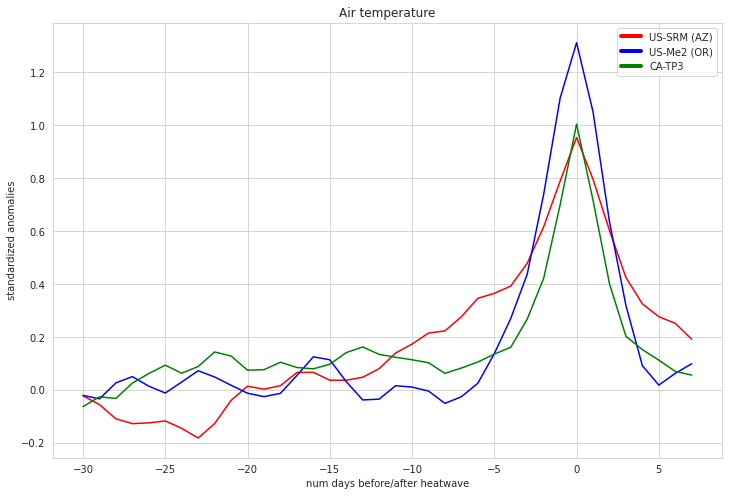

In [11]:
lag_composite("tas", "Air temperature")

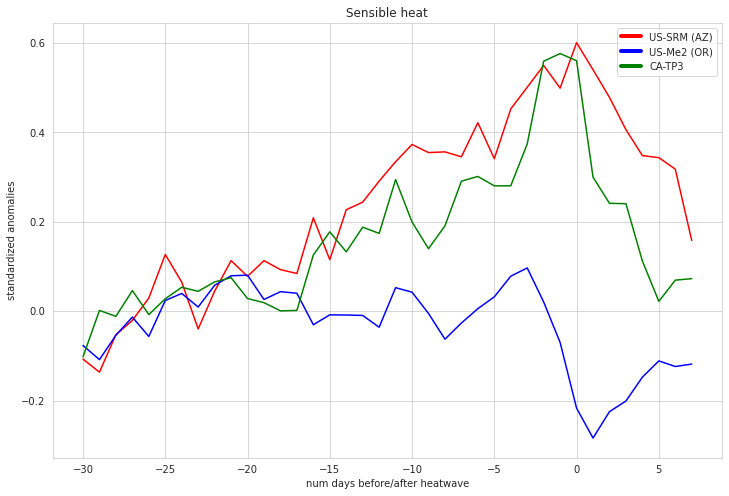

In [52]:
lag_composite("shflx", "Sensible heat")

In [ ]:
lag_composite("slhf", "Latent heat")

In [14]:
srm.where(srm.netrad>-2000).netrad.mean()

<xarray.DataArray 'netrad' ()>
array(100.54061441)

In [15]:
me2.where(me2.netrad>-2000).netrad.mean()

<xarray.DataArray 'netrad' ()>
array(97.09024374)

In [21]:
tp3.where(tp3.netrad>-2000).netrad.mean()

<xarray.DataArray 'netrad' ()>
array(83.33014369)

In [17]:
e_netrad = xr.open_dataset("/home/data/ERA5/ssr/monthly/ssr.nc")

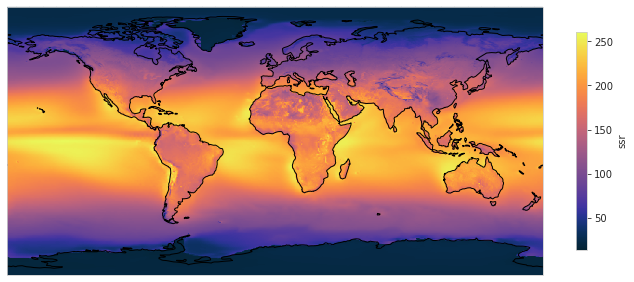

In [22]:
plot_climatology(e_netrad.ssr)

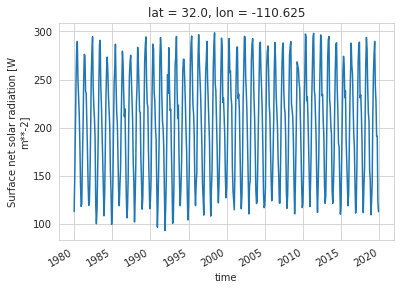

In [43]:
e_netrad.sel(lat=srm.lat.item(),lon=srm.lon.item(), method="nearest").ssr.plot()

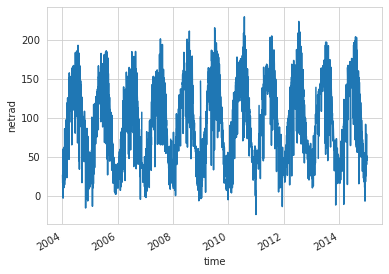

In [46]:
srm.where(srm.netrad>-200).netrad.plot()

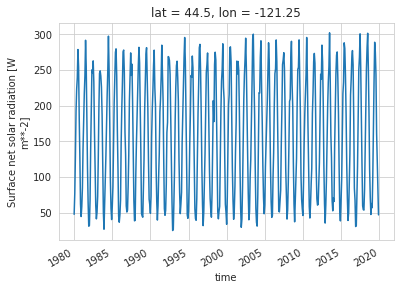

In [44]:
e_netrad.sel(lat=me2.lat.item(),lon=me2.lon.item(), method="nearest").ssr.plot()

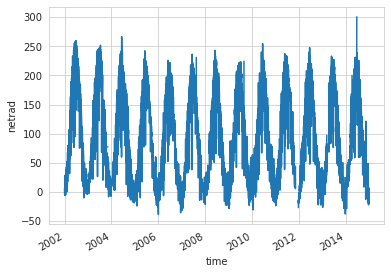

In [45]:
me2.where(me2.netrad>-200).netrad.plot()

In [41]:
e_netrad.sel(lat=tp3.lat.item(),lon=tp3.lon.item(), method="nearest").ssr.mean()

<xarray.DataArray 'ssr' ()>
array(150.47194, dtype=float32)
Coordinates:
    lat      float32 42.5
    lon      float64 -80.62

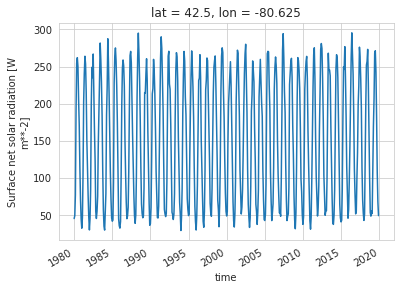

In [31]:
e_netrad.sel(lat=tp3.lat.item(),lon=tp3.lon.item(), method="nearest").ssr.plot()

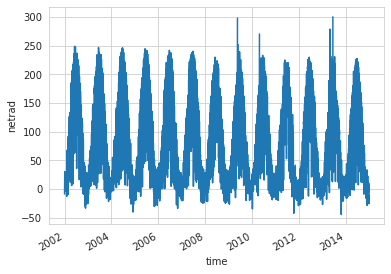

In [34]:
tp3.where(tp3.netrad>-200).netrad.plot()

In [41]:
def calc_heatwave_anoms(var):
    lats, lons, hw_anoms = [], [], []
    for i in NH_stations:
        data = xr.open_dataset(i)
        try:
            anoms = std_anoms(data[var])
            heatwave_days = data.tas[data.tas>=data.tas.quantile(0.95)].time.values
            hw_anom = anoms.sel(time=heatwave_days).mean().item()
            lats.append(data.lat.item())
            lons.append(data.lon.item())
            hw_anoms.append(hw_anom)
        except:
            pass
    return pd.DataFrame(data={'lat':lats, 'lon':lons, 'hw_anom':hw_anoms})

In [42]:
extent = [-135, -60, 23, 70]

def plot_stations(var="tas",mn=0,mx=100,lvn=10,cmap=cmo.thermal, long_name=""):
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree())

    ax.set_extent(extent, crs=ccrs.PlateCarree())
#     plt.contourf(dat.lon, dat.lat, md_avg, cmap = cmap,
#                  vmin = mn, vmax = mx,levels = np.linspace(mn,mx,lvn+1),extend = 'both')
    
    
    df = calc_heatwave_anoms(var)
    plt.scatter(x = df.lon, y = df.lat, c = df.hw_anom,
               cmap = cmap,s=150, alpha=.8, linewidths=1.5,
               edgecolors='white' ,transform=ccrs.PlateCarree(),
               vmin = mn, vmax = mx,zorder = 5)
    plt.colorbar(shrink = 0.5)

    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='k')
    ax.add_feature(cfeature.LAKES, edgecolor='black')

    plt.title("standardized anomalies of "+long_name + " during heatwave days")
        
    plt.show()

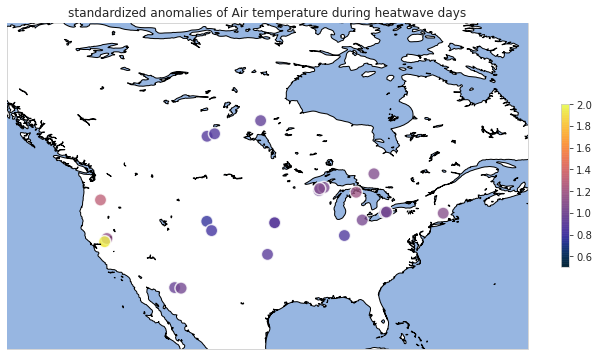

In [34]:
plot_stations("tas", mn=0.5, mx=2, long_name="Air temperature")

In [43]:
calc_heatwave_anoms("swc")

,lat,lon,hw_anom
0,45.805900,-90.079900,-0.183359
1,38.413300,-120.950700,0.150959
2,45.559800,-84.713800,0.221304
3,41.179670,-96.439650,1.326909
4,41.366530,-106.239900,0.321272
5,38.895300,-120.632800,0.008349
6,40.032900,-105.546400,0.115178
7,31.821400,-110.866100,-0.748153
8,46.242000,-89.347700,-0.071833
9,53.628890,-106.197790,0.122637


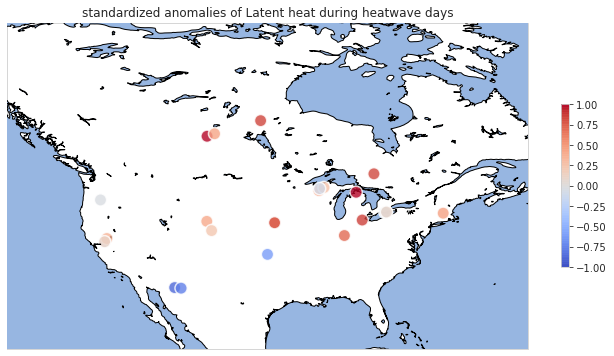

In [35]:
plot_stations("slhf", mn=-1, mx=1, cmap="coolwarm", long_name="Latent heat")

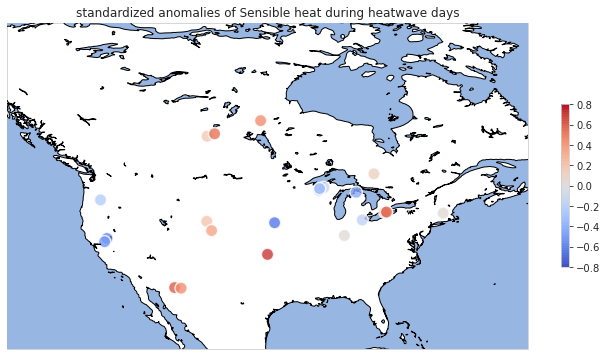

In [38]:
plot_stations("shflx", mn=-0.8, mx=0.8, cmap="coolwarm", long_name="Sensible heat")

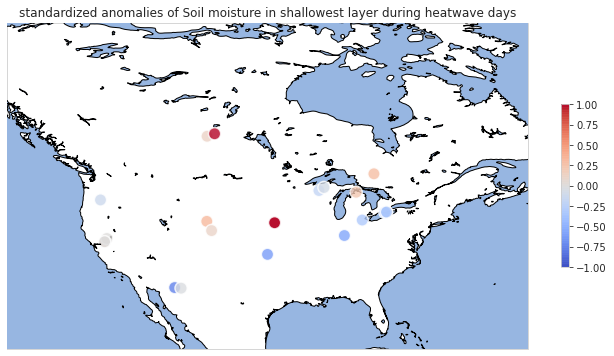

In [44]:
plot_stations("swc", mn=-1, mx=1, cmap="coolwarm", long_name="Soil moisture in shallowest layer")
# ignore this

In [9]:
def lag_composite_vars(data, long_name=""):
    heatwave_days = data.tas[data.tas>=data.tas.quantile(0.95)].time.values
    
    tas_anoms = std_anoms(data["tas"])
    slhf_anoms = std_anoms(data["slhf"])
    shflx_anoms = std_anoms(data["shflx"])
    try:
        swc_anoms = std_anoms(data["swc"])
    except:
        pass
    
    tas_means = lc_helper(heatwave_days, tas_anoms)
    slhf_means = lc_helper(heatwave_days, slhf_anoms)
    shflx_means = lc_helper(heatwave_days, shflx_anoms)
    try:
        swc_means = lc_helper(heatwave_days, swc_anoms)
    except:
        pass
    
    days = range(-30, 8)
    fig, ax = plt.subplots(figsize=(12,8))
    
    plt.plot(days, tas_means, '-r')
    plt.plot(days, slhf_means, '-b')
    plt.plot(days, shflx_means, '-g')
    try:
        plt.plot(days, swc_means, '-y')
    except:
        pass
    
    custom_lines = [Line2D([0], [0], color='r', lw=4),
                Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4),
                Line2D([0], [0], color='y', lw=4)]

    ax.legend(custom_lines, ['TAS', 'SLHF', 'SSHF', 'SWC'])
    
    ax.set_xlabel("num days before/after heatwave")
    ax.set_ylabel("standardized anomalies")
    
    plt.title(long_name)
    plt.show()

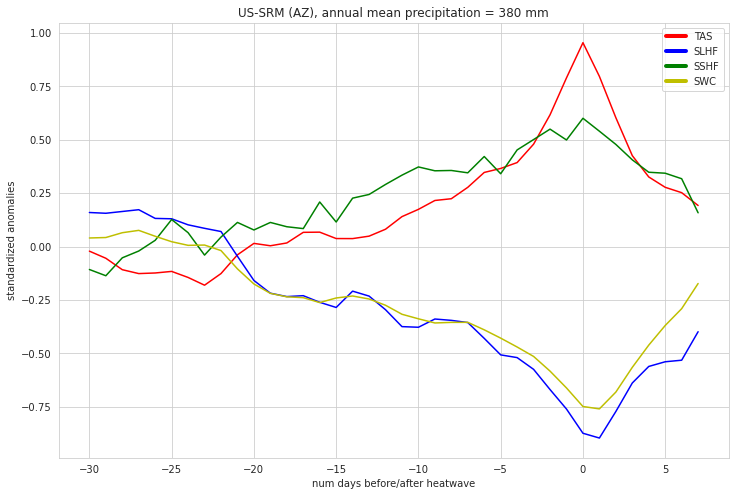

In [10]:
lag_composite_vars(xr.open_dataset(outdir+"US-SRM.nc"), "US-SRM (AZ), annual mean precipitation = 380 mm")

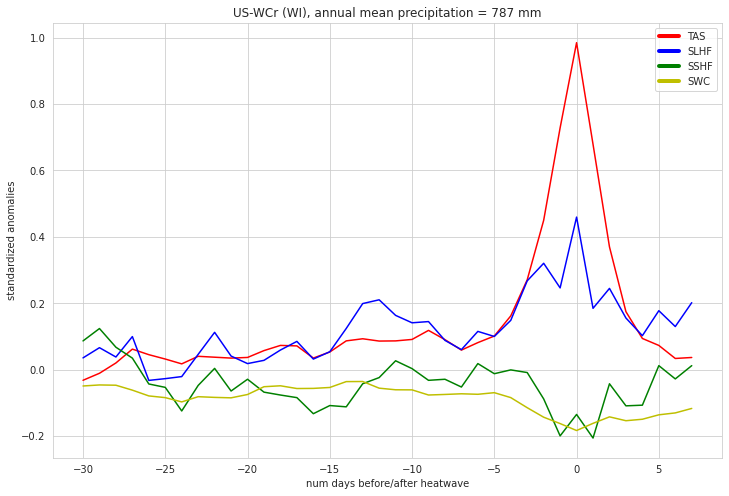

In [11]:
lag_composite_vars(xr.open_dataset(outdir+"US-WCr.nc"), "US-WCr (WI), annual mean precipitation = 787 mm")

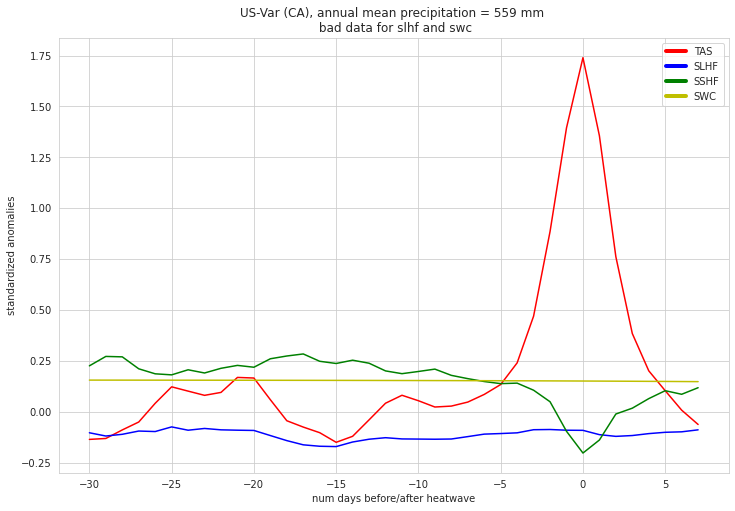

In [13]:
lag_composite_vars(xr.open_dataset(outdir+"US-Var.nc"), "US-Var (CA), annual mean precipitation = 559 mm \n bad data for slhf and swc")

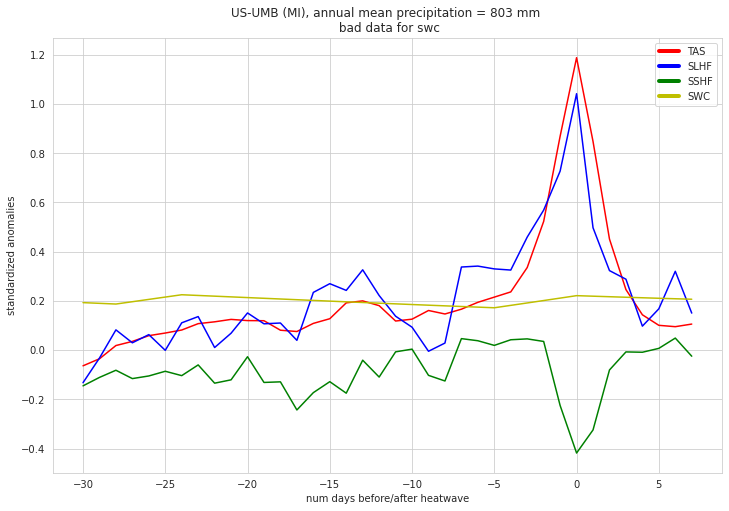

In [14]:
lag_composite_vars(xr.open_dataset(outdir+"US-UMB.nc"), "US-UMB (MI), annual mean precipitation = 803 mm \n bad data for swc")

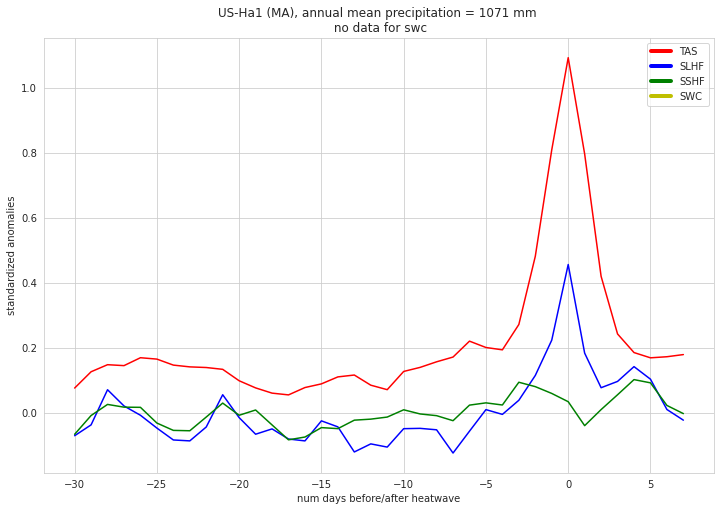

In [15]:
lag_composite_vars(xr.open_dataset(outdir+"US-Ha1.nc"), "US-Ha1 (MA), annual mean precipitation = 1071 mm \n no data for swc")

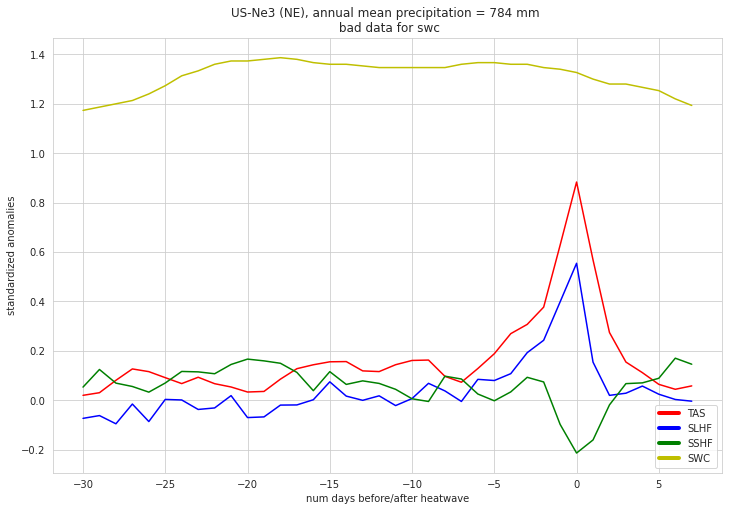

In [16]:
lag_composite_vars(xr.open_dataset(outdir+"US-Ne3.nc"), "US-Ne3 (NE), annual mean precipitation = 784 mm \n bad data for swc")

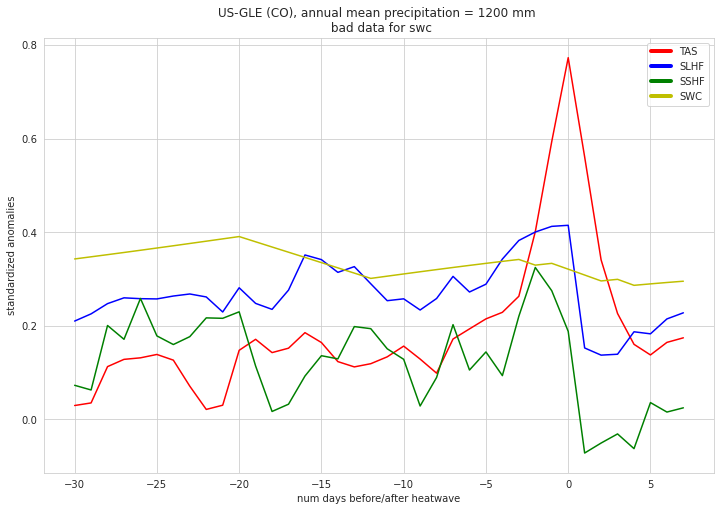

In [17]:
lag_composite_vars(xr.open_dataset(outdir+"US-GLE.nc"), "US-GLE (CO), annual mean precipitation = 1200 mm \n bad data for swc")

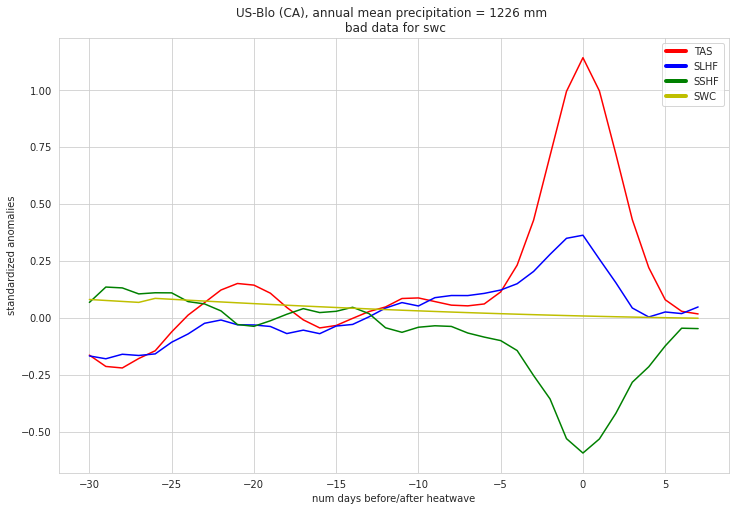

In [18]:
lag_composite_vars(xr.open_dataset(outdir+"US-Blo.nc"), "US-Blo (CA), annual mean precipitation = 1226 mm \n bad data for swc")

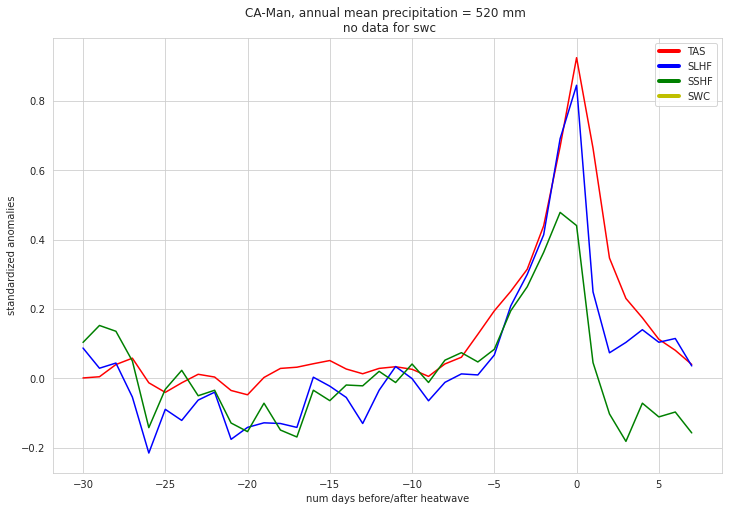

In [19]:
lag_composite_vars(xr.open_dataset(outdir+"CA-Man.nc"), "CA-Man, annual mean precipitation = 520 mm \n no data for swc")

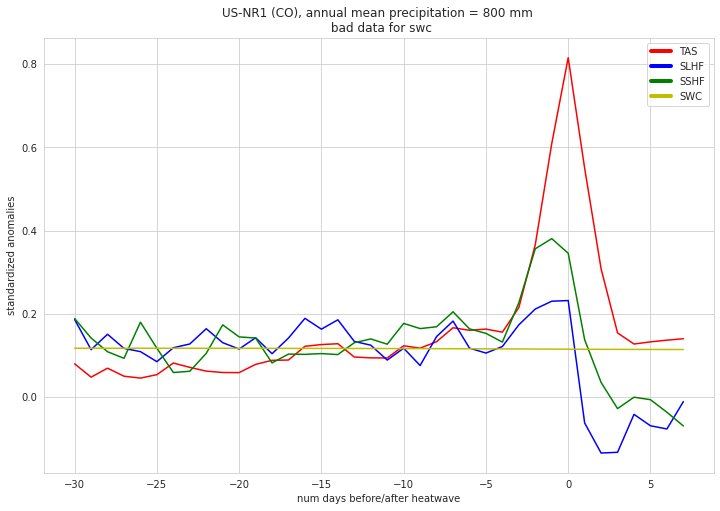

In [20]:
lag_composite_vars(xr.open_dataset(outdir+"US-NR1.nc"), "US-NR1 (CO), annual mean precipitation = 800 mm \n bad data for swc")

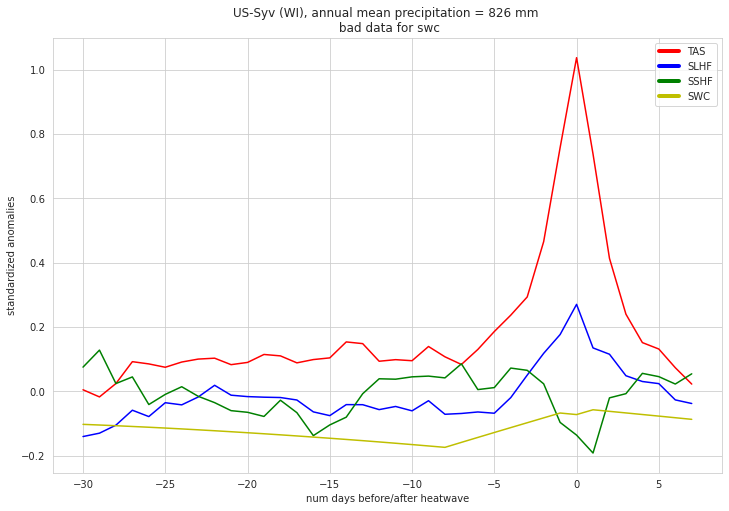

In [21]:
lag_composite_vars(xr.open_dataset(outdir+"US-Syv.nc"), "US-Syv (WI), annual mean precipitation = 826 mm \n bad data for swc")

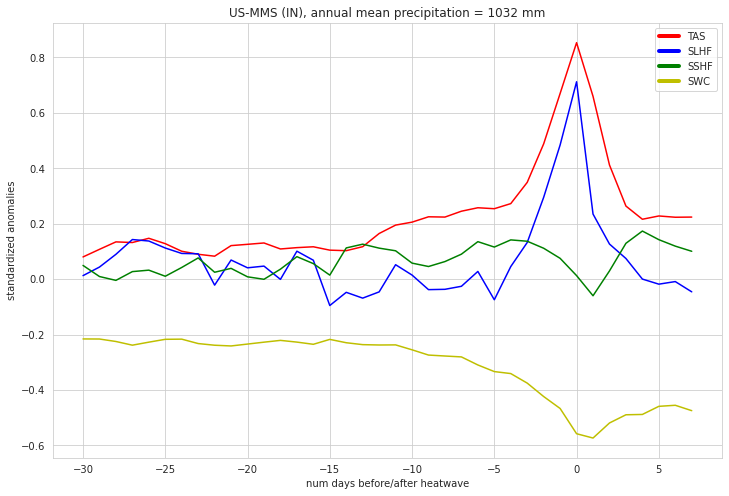

In [22]:
lag_composite_vars(xr.open_dataset(outdir+"US-MMS.nc"), "US-MMS (IN), annual mean precipitation = 1032 mm")

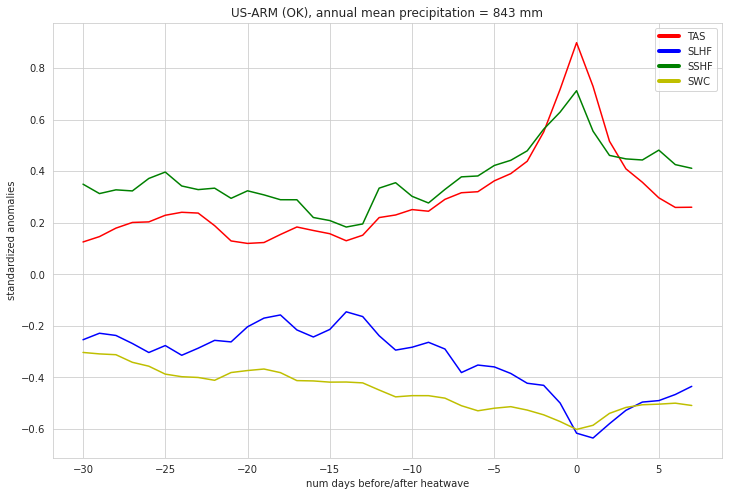

In [23]:
lag_composite_vars(xr.open_dataset(outdir+"US-ARM.nc"), "US-ARM (OK), annual mean precipitation = 843 mm")

/home/dhruv/fluxnet/US-WCr.nc


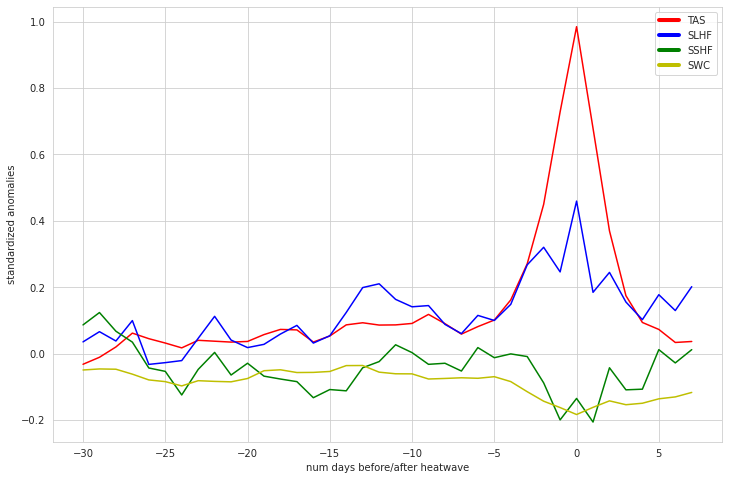

/home/dhruv/fluxnet/US-Var.nc


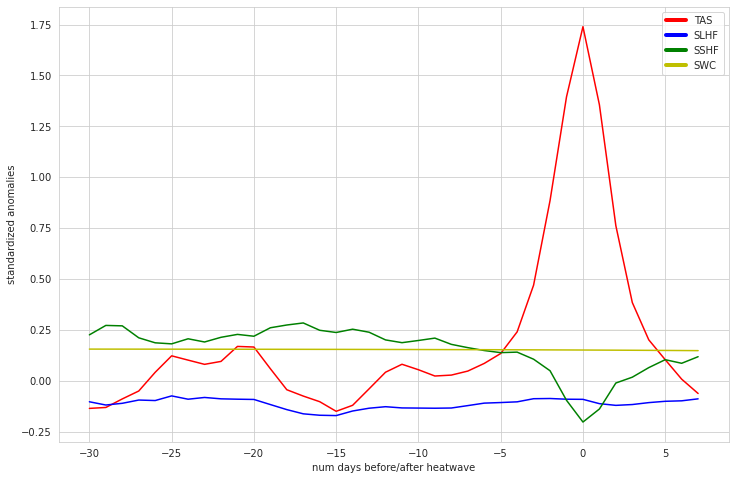

/home/dhruv/fluxnet/US-UMB.nc


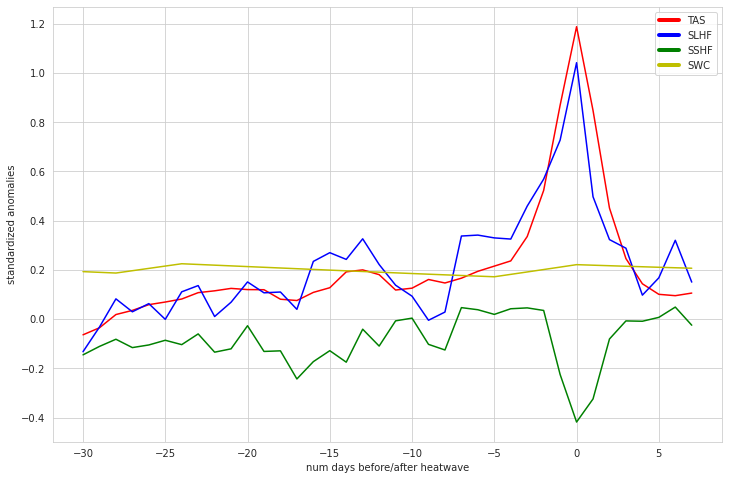

/home/dhruv/fluxnet/US-Ha1.nc


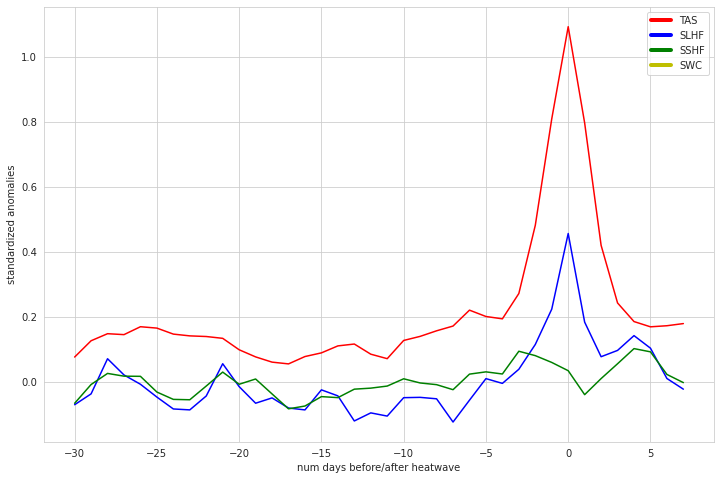

/home/dhruv/fluxnet/US-Ne3.nc


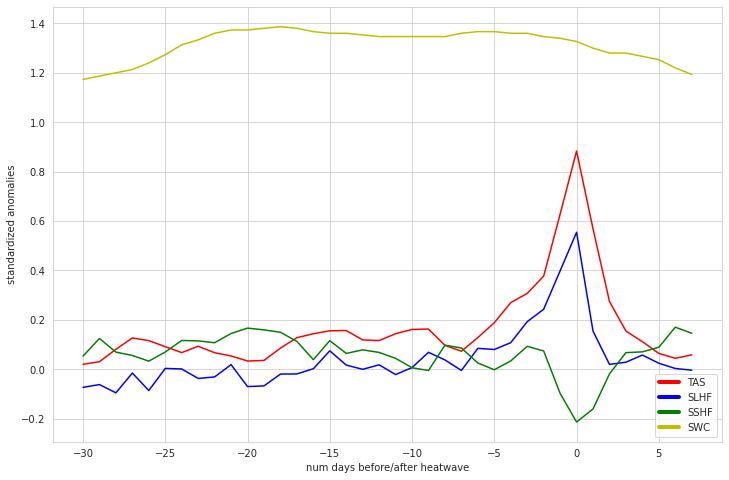

/home/dhruv/fluxnet/US-GLE.nc


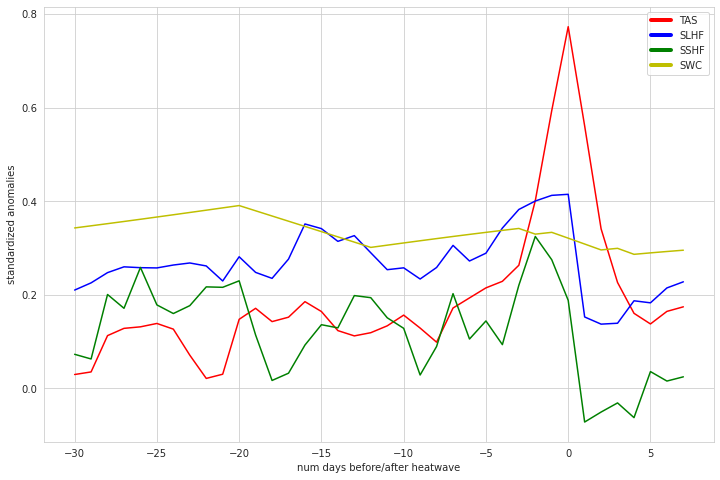

/home/dhruv/fluxnet/US-Blo.nc


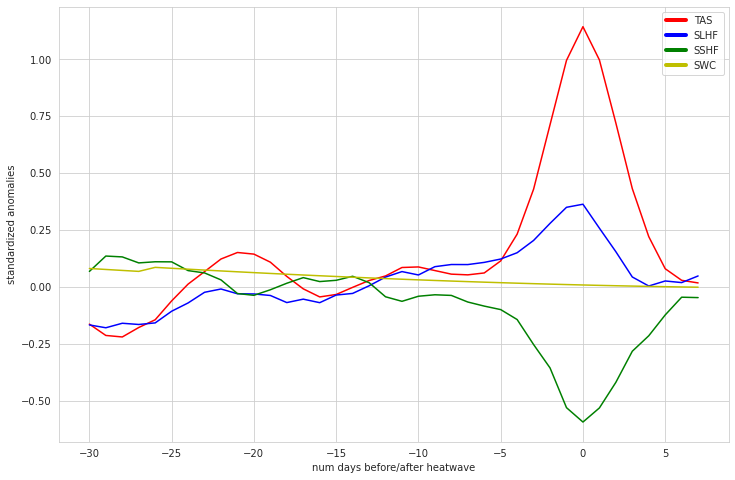

/home/dhruv/fluxnet/CA-Man.nc


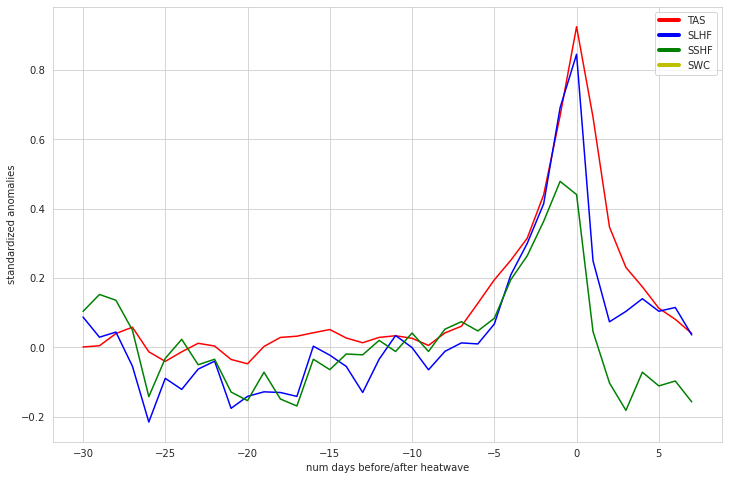

/home/dhruv/fluxnet/US-NR1.nc


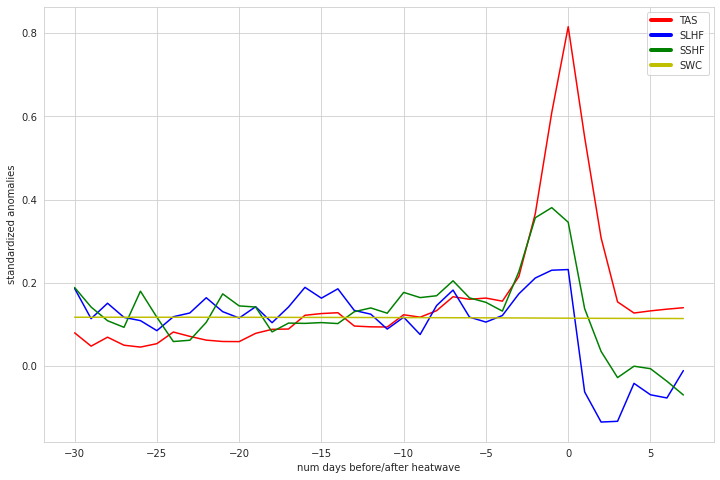

/home/dhruv/fluxnet/US-SRM.nc


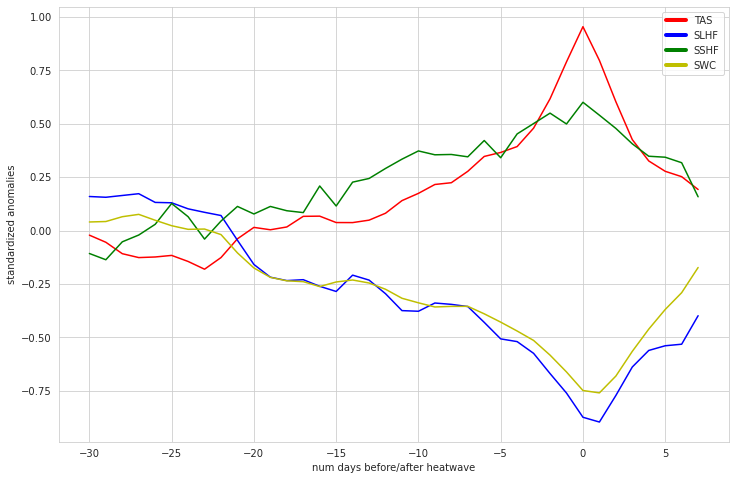

/home/dhruv/fluxnet/US-Syv.nc


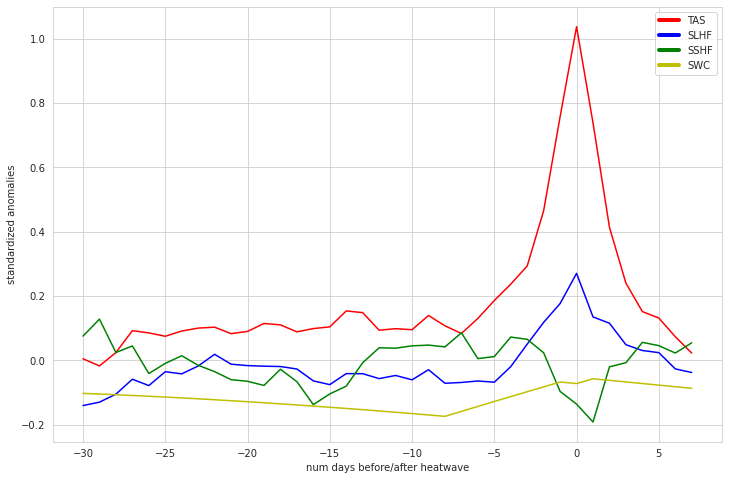

/home/dhruv/fluxnet/CA-Oas.nc


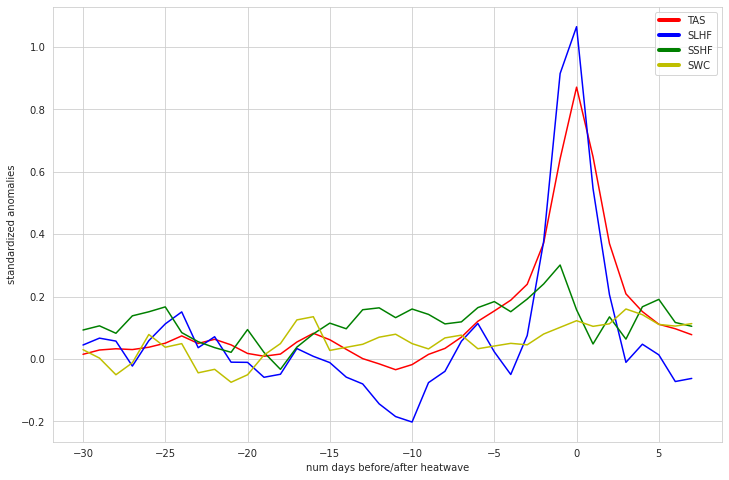

/home/dhruv/fluxnet/CA-Gro.nc


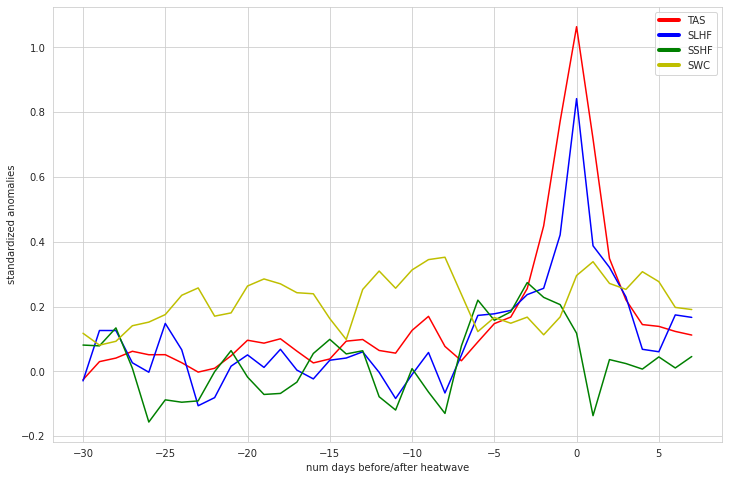

/home/dhruv/fluxnet/CA-TP4.nc


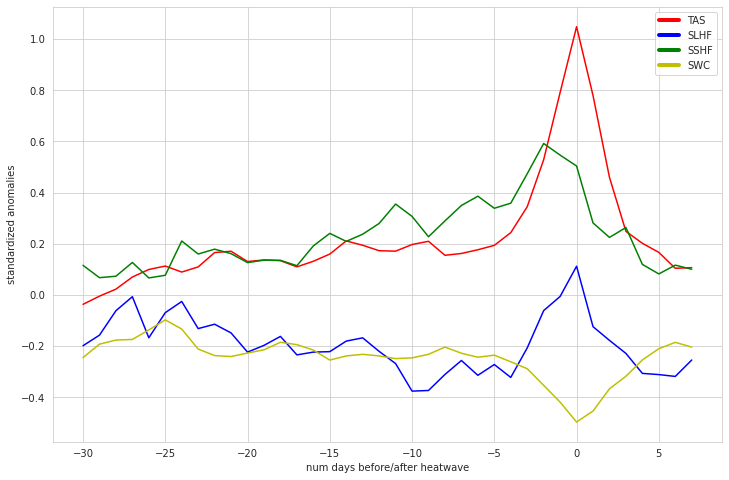

/home/dhruv/fluxnet/CA-TP1.nc


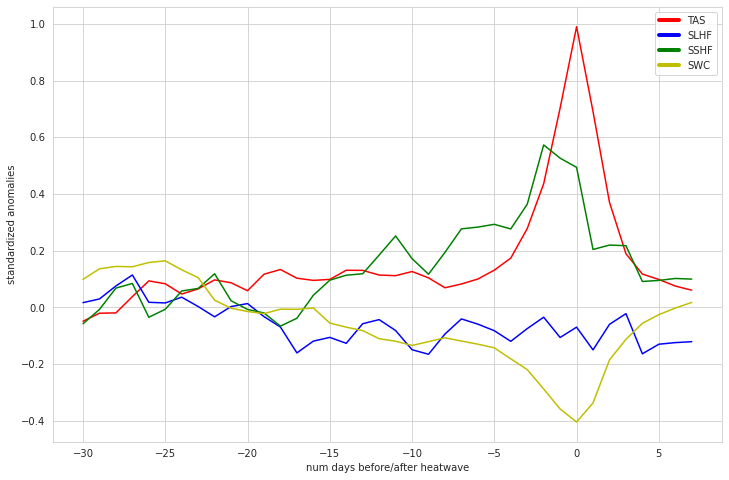

/home/dhruv/fluxnet/US-Me2.nc


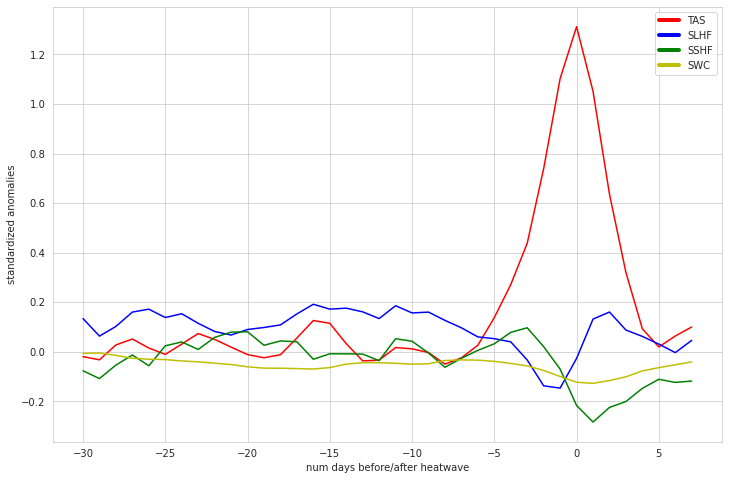

/home/dhruv/fluxnet/US-Oho.nc


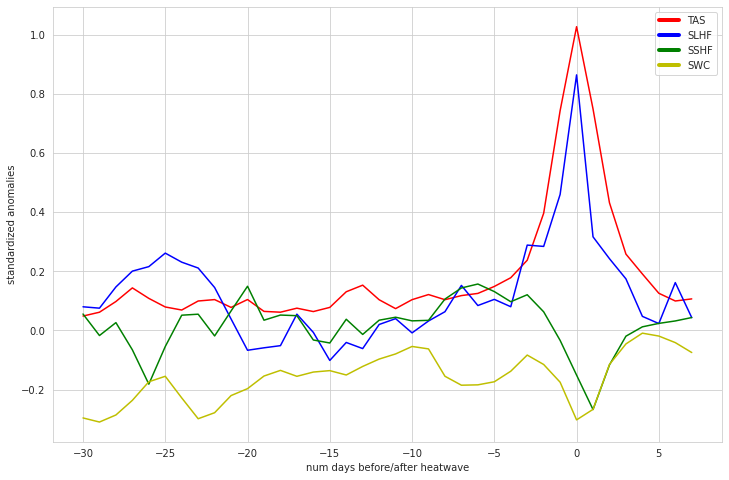

/home/dhruv/fluxnet/US-Los.nc


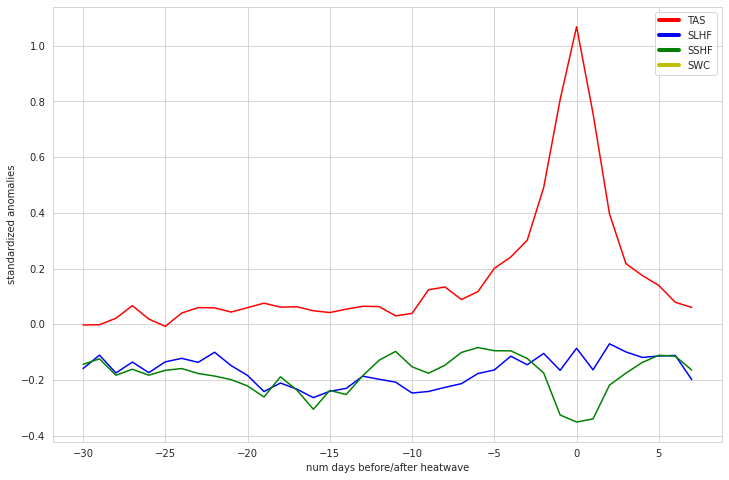

/home/dhruv/fluxnet/CA-Obs.nc


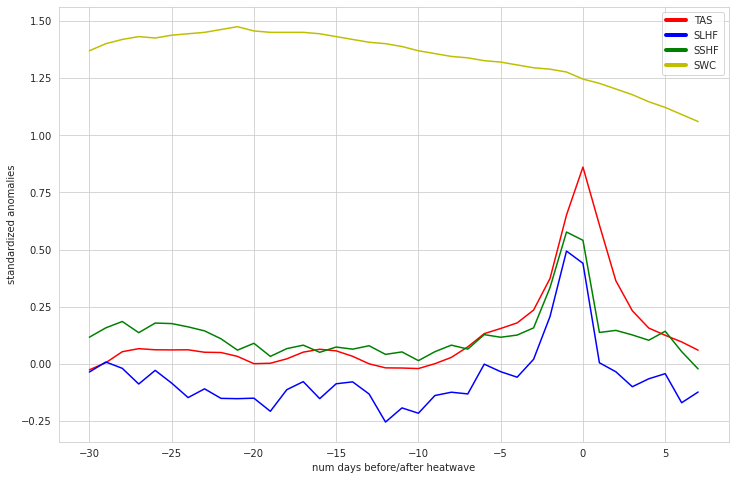

/home/dhruv/fluxnet/US-MMS.nc


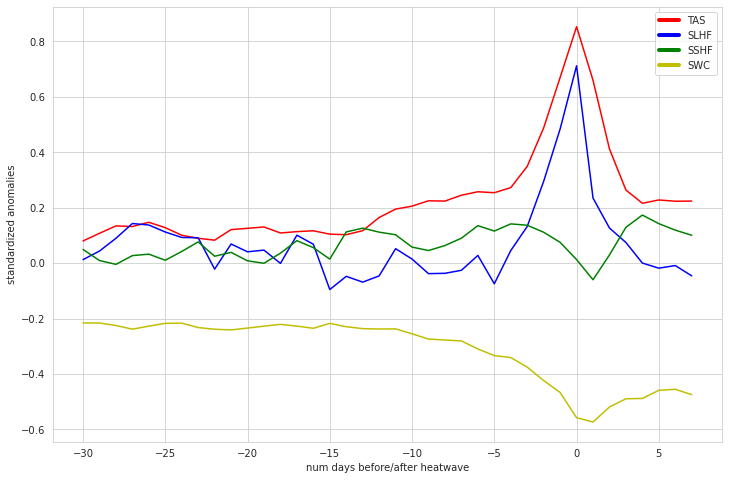

/home/dhruv/fluxnet/US-Ne2.nc


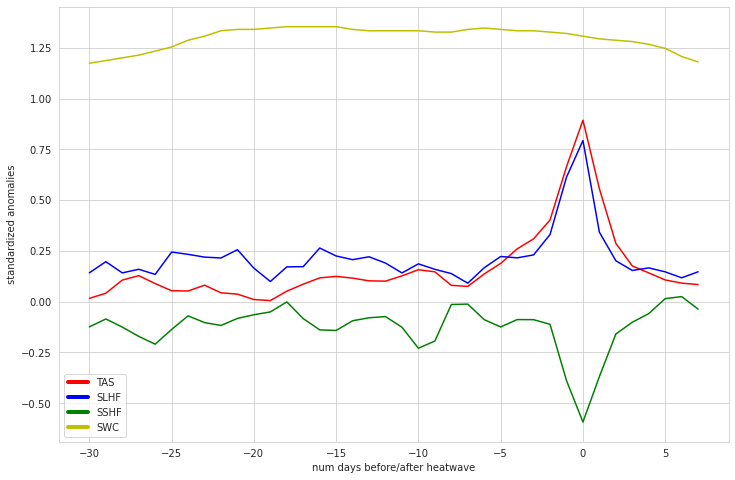

/home/dhruv/fluxnet/US-Wkg.nc


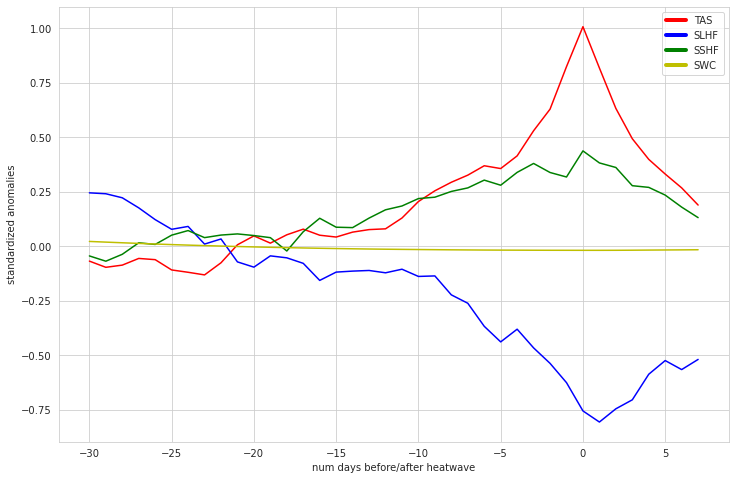

/home/dhruv/fluxnet/US-ARM.nc


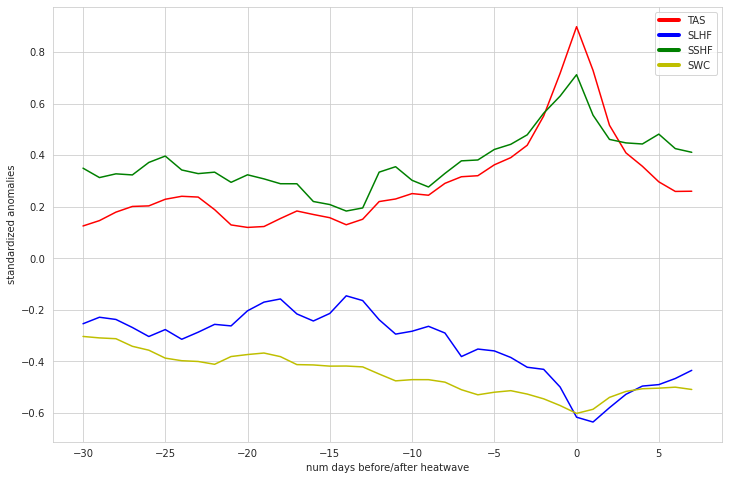

/home/dhruv/fluxnet/CA-TP3.nc


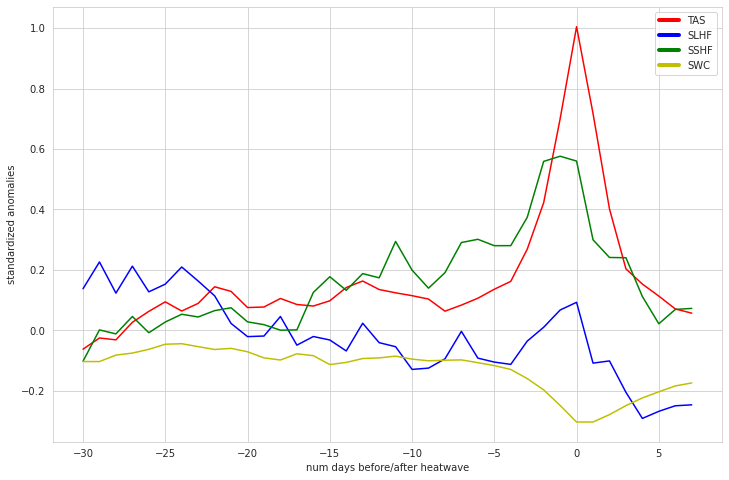

/home/dhruv/fluxnet/US-Ton.nc


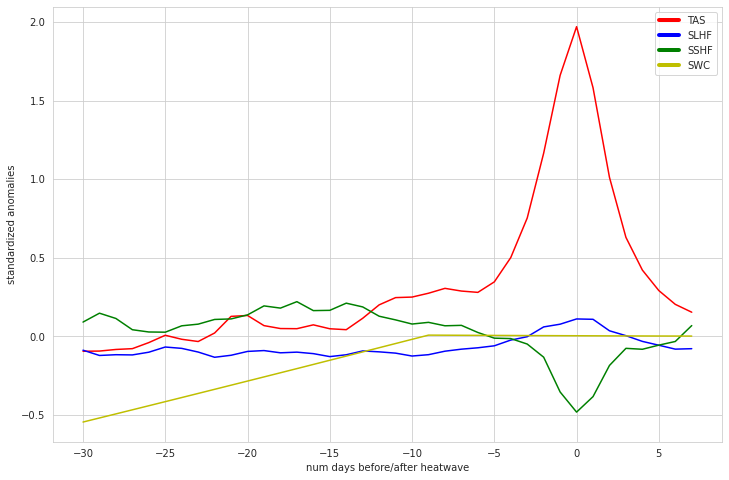

In [56]:
for i in NH_stations:
    print(i)
    lag_composite_vars(xr.open_dataset(i))
    plt.show()